Linearni klasifikator

In [5]:
# step_00_download_and_inspect.py
!pip install kagglehub

from pathlib import Path
from collections import Counter

import kagglehub


DATASET_ID = "paultimothymooney/blood-cells"
IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp"}


def find_image_files(root):
    root = Path(root)
    return [p for p in root.rglob("*") if p.suffix.lower() in IMAGE_EXTENSIONS]


def print_tree(root, max_depth=4):
    root = Path(root)
    print(f"\nDataset root:\n{root}\n")

    for path in sorted(root.rglob("*")):
        depth = len(path.relative_to(root).parts)
        if depth > max_depth:
            continue

        indent = "    " * (depth - 1)
        marker = "[DIR]" if path.is_dir() else "[FILE]"
        print(f"{indent}{marker} {path.name}")


def summarize_by_parent_folder(image_paths):
    counts = Counter(p.parent.name for p in image_paths)

    print("\nImage count by immediate parent folder:")
    for folder_name, count in counts.most_common():
        print(f"{folder_name:20s} {count}")


def main():
    dataset_path = kagglehub.dataset_download(DATASET_ID)
    dataset_path = Path(dataset_path)

    print_tree(dataset_path, max_depth=4)

    image_paths = find_image_files(dataset_path)

    print(f"\nTotal image files found: {len(image_paths)}")
    summarize_by_parent_folder(image_paths)

    print("\nFirst 10 image paths:")
    for path in image_paths[:10]:
        print(path)


if __name__ == "__main__":
    main()

Using Colab cache for faster access to the 'blood-cells' dataset.

Dataset root:
/kaggle/input/blood-cells

[DIR] dataset-master
    [DIR] dataset-master
        [DIR] Annotations
            [FILE] BloodImage_00000.xml
            [FILE] BloodImage_00001.xml
            [FILE] BloodImage_00002.xml
            [FILE] BloodImage_00003.xml
            [FILE] BloodImage_00004.xml
            [FILE] BloodImage_00005.xml
            [FILE] BloodImage_00006.xml
            [FILE] BloodImage_00007.xml
            [FILE] BloodImage_00008.xml
            [FILE] BloodImage_00009.xml
            [FILE] BloodImage_00010.xml
            [FILE] BloodImage_00011.xml
            [FILE] BloodImage_00012.xml
            [FILE] BloodImage_00013.xml
            [FILE] BloodImage_00014.xml
            [FILE] BloodImage_00015.xml
            [FILE] BloodImage_00016.xml
            [FILE] BloodImage_00017.xml
            [FILE] BloodImage_00018.xml
            [FILE] BloodImage_00019.xml
            [FILE] B

In [6]:
from pathlib import Path
from collections import Counter

import torch
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from torchvision import datasets, transforms
from torch.utils.data import DataLoader


DATASET_ROOT = Path("/kaggle/input/blood-cells/dataset2-master/dataset2-master/images")

TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"
TEST_SIMPLE_DIR = DATASET_ROOT / "TEST_SIMPLE"

IMG_SIZE = 64
BATCH_SIZE = 32
SEED = 42

torch.manual_seed(SEED)
np.random.seed(SEED)


def count_images_by_class(folder):
    counts = {}

    for class_dir in sorted(folder.iterdir()):
        if class_dir.is_dir():
            image_count = len(list(class_dir.glob("*")))
            counts[class_dir.name] = image_count

    return counts


def print_counts(title, counts):
    print(title)
    print("-" * len(title))

    total = sum(counts.values())

    for class_name, count in counts.items():
        percentage = count / total * 100
        print(f"{class_name:12s}: {count:5d} images ({percentage:5.2f}%)")

    print(f"{'TOTAL':12s}: {total:5d} images\n")


train_counts = count_images_by_class(TRAIN_DIR)
test_counts = count_images_by_class(TEST_DIR)

print_counts("TRAIN SET", train_counts)
print_counts("TEST SET", test_counts)

print("Dataset root exists:", DATASET_ROOT.exists())
print("Train dir exists:", TRAIN_DIR.exists())
print("Test dir exists:", TEST_DIR.exists())

TRAIN SET
---------
EOSINOPHIL  :  2497 images (25.08%)
LYMPHOCYTE  :  2483 images (24.94%)
MONOCYTE    :  2478 images (24.89%)
NEUTROPHIL  :  2499 images (25.10%)
TOTAL       :  9957 images

TEST SET
--------
EOSINOPHIL  :   623 images (25.05%)
LYMPHOCYTE  :   620 images (24.93%)
MONOCYTE    :   620 images (24.93%)
NEUTROPHIL  :   624 images (25.09%)
TOTAL       :  2487 images

Dataset root exists: True
Train dir exists: True
Test dir exists: True


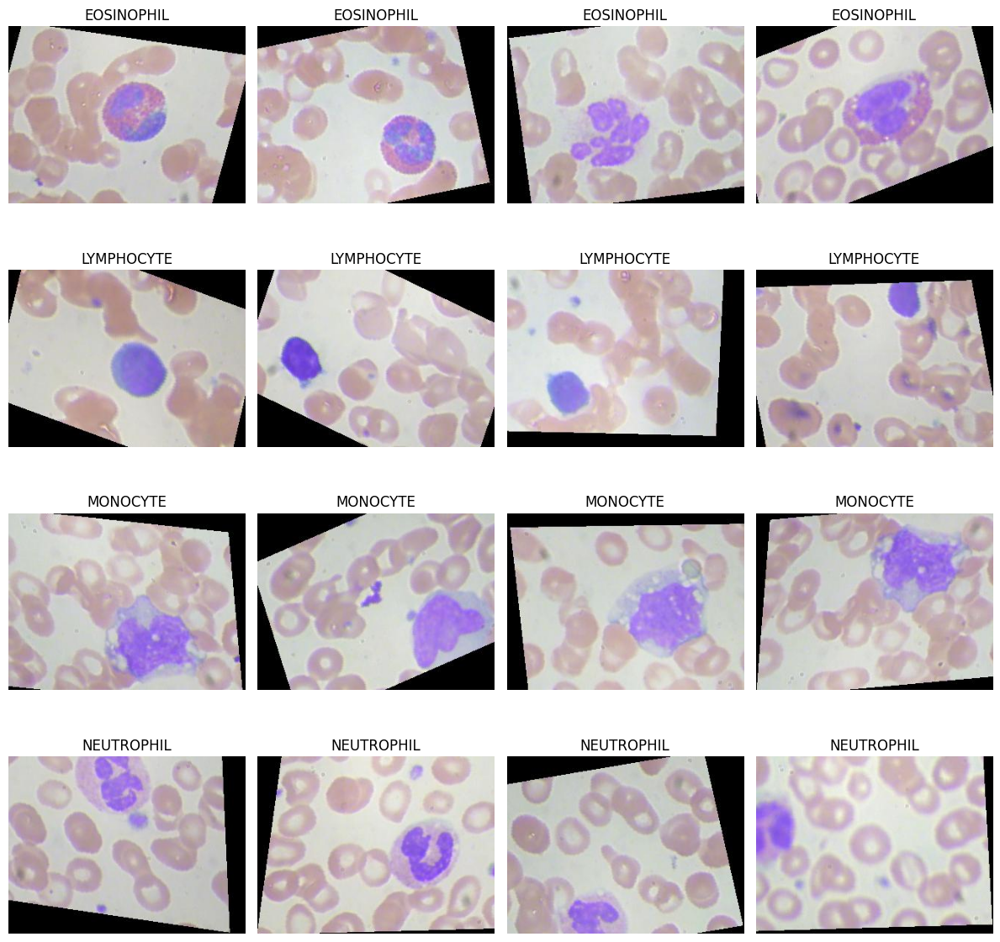

In [3]:
def show_sample_images(folder, samples_per_class=4):
    class_dirs = [p for p in sorted(folder.iterdir()) if p.is_dir()]

    rows = len(class_dirs)
    cols = samples_per_class

    plt.figure(figsize=(cols * 3, rows * 3))

    plot_idx = 1

    for class_dir in class_dirs:
        image_paths = sorted(list(class_dir.glob("*")))[:samples_per_class]

        for image_path in image_paths:
            image = Image.open(image_path).convert("RGB")

            plt.subplot(rows, cols, plot_idx)
            plt.imshow(image)
            plt.title(class_dir.name)
            plt.axis("off")

            plot_idx += 1

    plt.tight_layout()
    plt.show()


show_sample_images(TRAIN_DIR, samples_per_class=4)

In [7]:
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])

train_dataset = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

print("Classes:", train_dataset.classes)
print("Class to index:", train_dataset.class_to_idx)

print("Train samples:", len(train_dataset))
print("Test samples:", len(test_dataset))

images, labels = next(iter(train_loader))

print("Batch image shape:", images.shape)
print("Batch label shape:", labels.shape)
print("Min pixel value:", images.min().item())
print("Max pixel value:", images.max().item())

Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
Class to index: {'EOSINOPHIL': 0, 'LYMPHOCYTE': 1, 'MONOCYTE': 2, 'NEUTROPHIL': 3}
Train samples: 9957
Test samples: 2487
Batch image shape: torch.Size([32, 3, 64, 64])
Batch label shape: torch.Size([32])
Min pixel value: 0.0
Max pixel value: 0.9686274528503418


In [8]:
def majority_baseline_accuracy(train_dataset, test_dataset):
    train_labels = [label for _, label in train_dataset.samples]
    test_labels = [label for _, label in test_dataset.samples]

    majority_class = Counter(train_labels).most_common(1)[0][0]

    correct = sum(label == majority_class for label in test_labels)
    accuracy = correct / len(test_labels)

    idx_to_class = {idx: class_name for class_name, idx in train_dataset.class_to_idx.items()}

    print("Majority class:", idx_to_class[majority_class])
    print(f"Majority baseline accuracy: {accuracy:.4f}")


majority_baseline_accuracy(train_dataset, test_dataset)

Majority class: NEUTROPHIL
Majority baseline accuracy: 0.2509


In [6]:
import torch
import torch.nn as nn
import torch.optim as optim

from tqdm.auto import tqdm


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

INPUT_DIM = 3 * IMG_SIZE * IMG_SIZE
NUM_CLASSES = len(train_dataset.classes)

EPOCHS = 10
LR = 1e-3


class LinearClassifier(nn.Module):
    def __init__(self, input_dim, num_classes):
        super().__init__()
        self.flatten = nn.Flatten()
        self.classifier = nn.Linear(input_dim, num_classes)

    def forward(self, x):
        x = self.flatten(x)
        x = self.classifier(x)
        return x


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc, all_labels, all_preds


linear_model = LinearClassifier(INPUT_DIM, NUM_CLASSES).to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(linear_model.parameters(), lr=LR)

print("Device:", DEVICE)
print(linear_model)

history_linear = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": [],
}

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        linear_model,
        train_loader,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true_linear, y_pred_linear = evaluate(
        linear_model,
        test_loader,
        criterion,
        DEVICE
    )

    history_linear["train_loss"].append(train_loss)
    history_linear["train_acc"].append(train_acc)
    history_linear["test_loss"].append(test_loss)
    history_linear["test_acc"].append(test_acc)

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f}"
    )

Device: cpu
LinearClassifier(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (classifier): Linear(in_features=12288, out_features=4, bias=True)
)


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [1/10] Train Loss: 1.7998 | Train Acc: 0.2581 | Test Loss: 1.4898 | Test Acc: 0.2887


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
self._shutdown_workers()
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
self._shutdown_workers()    if w.is_alive():

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
       if w.is_alive():  
    ^  ^  ^ ^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^^    assert self._parent_pid == os.getpid(), 'can only test a child process'^
 
  File "/usr/lib/pytho

Epoch [2/10] Train Loss: 1.6788 | Train Acc: 0.2878 | Test Loss: 2.1333 | Test Acc: 0.2505


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [3/10] Train Loss: 1.6364 | Train Acc: 0.3201 | Test Loss: 1.8061 | Test Acc: 0.3136


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [4/10] Train Loss: 1.6228 | Train Acc: 0.3195 | Test Loss: 2.2376 | Test Acc: 0.2573


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [5/10] Train Loss: 1.6359 | Train Acc: 0.3418 | Test Loss: 1.8335 | Test Acc: 0.2533


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [6/10] Train Loss: 1.6026 | Train Acc: 0.3474 | Test Loss: 2.6634 | Test Acc: 0.2650


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [7/10] Train Loss: 1.6043 | Train Acc: 0.3516 | Test Loss: 1.4638 | Test Acc: 0.3828


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>  
 Traceback (most recent call last):
     File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
     self._shutdown_workers()  
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
 ^    ^if w.is_alive():^
^ ^ ^ ^ ^ ^  ^^^^^^^^^^^^^^^^

Epoch [8/10] Train Loss: 1.4782 | Train Acc: 0.3669 | Test Loss: 2.4632 | Test Acc: 0.2537


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [9/10] Train Loss: 1.5068 | Train Acc: 0.3687 | Test Loss: 2.7832 | Test Acc: 0.2807


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [10/10] Train Loss: 1.5329 | Train Acc: 0.3850 | Test Loss: 2.1216 | Test Acc: 0.2947


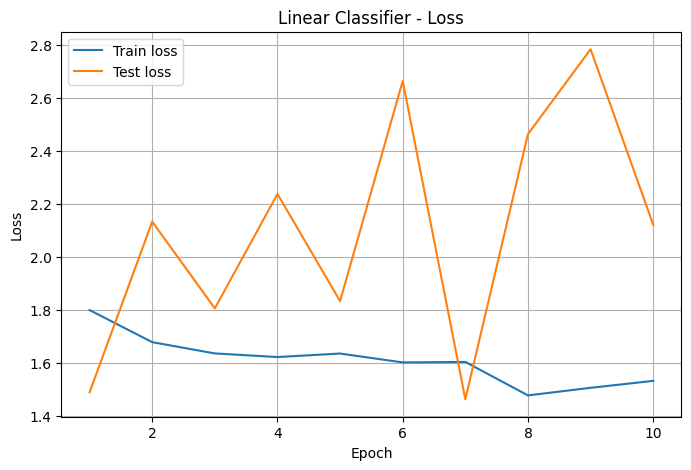

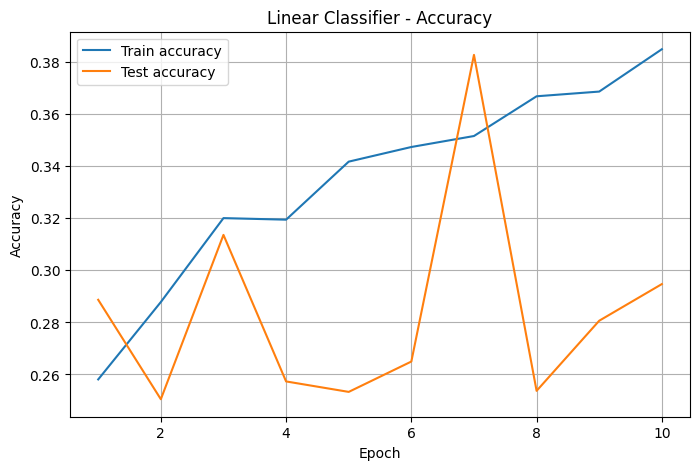

In [7]:
def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_training_history(history_linear, "Linear Classifier")

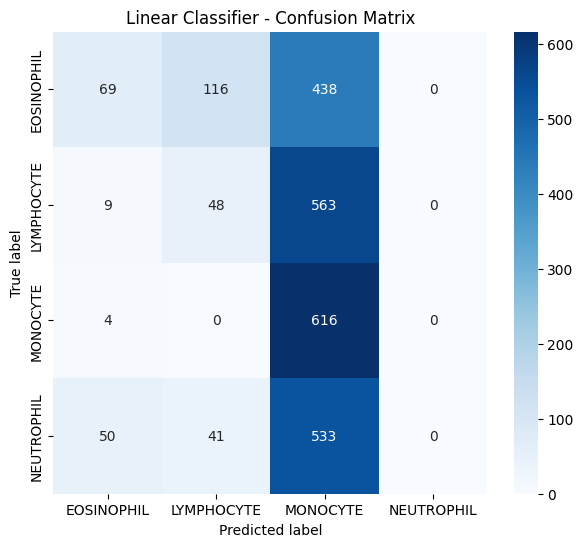

              precision    recall  f1-score   support

  EOSINOPHIL       0.52      0.11      0.18       623
  LYMPHOCYTE       0.23      0.08      0.12       620
    MONOCYTE       0.29      0.99      0.44       620
  NEUTROPHIL       0.00      0.00      0.00       624

    accuracy                           0.29      2487
   macro avg       0.26      0.30      0.19      2487
weighted avg       0.26      0.29      0.19      2487



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [8]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_confusion_matrix(
    y_true_linear,
    y_pred_linear,
    train_dataset.classes,
    "Linear Classifier - Confusion Matrix"
)

print(classification_report(
    y_true_linear,
    y_pred_linear,
    target_names=train_dataset.classes
))

Device: cpu
OneHiddenLayerMLP(
  (model): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=12288, out_features=256, bias=True)
    (2): ReLU()
    (3): Linear(in_features=256, out_features=4, bias=True)
  )
)


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [1/15] Train Loss: 1.5559 | Train Acc: 0.2488 | Test Loss: 1.4873 | Test Acc: 0.2598


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [2/15] Train Loss: 1.3965 | Train Acc: 0.2591 | Test Loss: 1.3926 | Test Acc: 0.2497


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [3/15] Train Loss: 1.3869 | Train Acc: 0.2540 | Test Loss: 1.3859 | Test Acc: 0.2521


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [4/15] Train Loss: 1.3865 | Train Acc: 0.2516 | Test Loss: 1.3864 | Test Acc: 0.2505


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [5/15] Train Loss: 1.3865 | Train Acc: 0.2499 | Test Loss: 1.3863 | Test Acc: 0.2505


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           Exception ignored in: ^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
^^    ^self._shutdown_workers()^
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
^    ^if w.is_alive():^
^ ^  ^^ ^ ^ ^ ^^^^

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [6/15] Train Loss: 1.3864 | Train Acc: 0.2508 | Test Loss: 1.3863 | Test Acc: 0.2505


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [7/15] Train Loss: 1.3864 | Train Acc: 0.2419 | Test Loss: 1.3863 | Test Acc: 0.2505


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [8/15] Train Loss: 1.3864 | Train Acc: 0.2513 | Test Loss: 1.3863 | Test Acc: 0.2509


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [9/15] Train Loss: 1.3864 | Train Acc: 0.2448 | Test Loss: 1.3863 | Test Acc: 0.2509


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [10/15] Train Loss: 1.3864 | Train Acc: 0.2511 | Test Loss: 1.3863 | Test Acc: 0.2505


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [11/15] Train Loss: 1.3864 | Train Acc: 0.2485 | Test Loss: 1.3863 | Test Acc: 0.2509


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child processException ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in 

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [12/15] Train Loss: 1.3864 | Train Acc: 0.2444 | Test Loss: 1.3863 | Test Acc: 0.2509


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [13/15] Train Loss: 1.3864 | Train Acc: 0.2396 | Test Loss: 1.3863 | Test Acc: 0.2505


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [14/15] Train Loss: 1.3864 | Train Acc: 0.2487 | Test Loss: 1.3863 | Test Acc: 0.2509


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [15/15] Train Loss: 1.3864 | Train Acc: 0.2460 | Test Loss: 1.3863 | Test Acc: 0.2509

Best test accuracy: 0.2598
Best epoch: 1


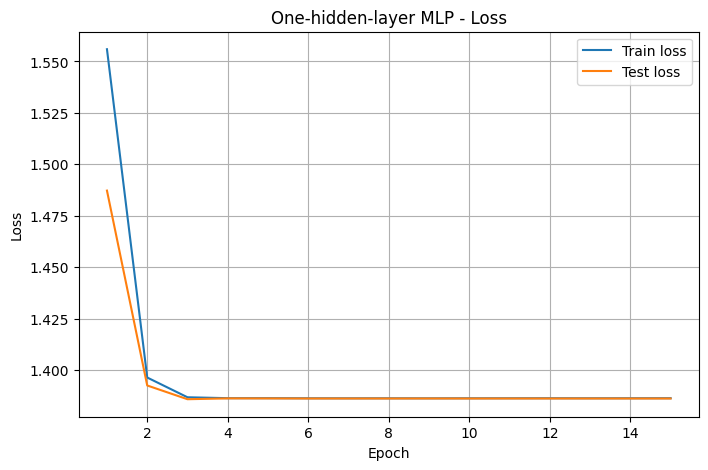

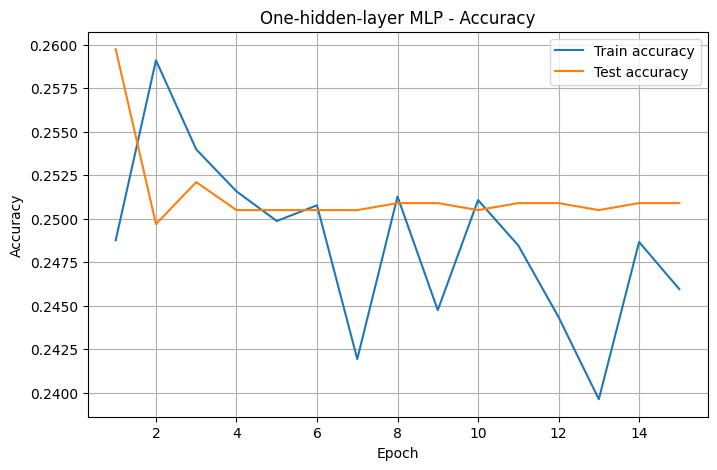

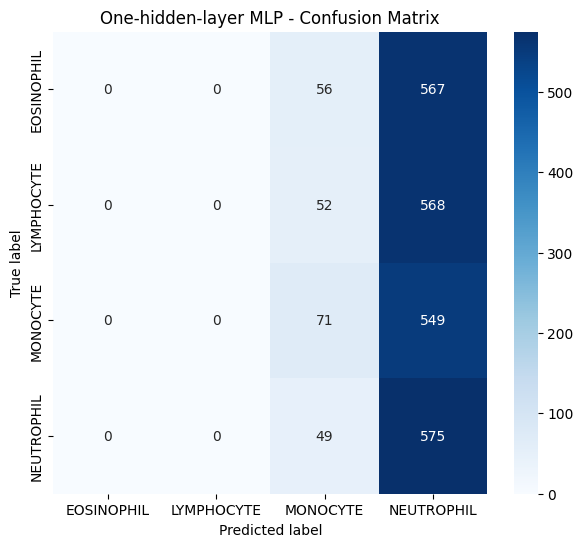

              precision    recall  f1-score   support

  EOSINOPHIL       0.00      0.00      0.00       623
  LYMPHOCYTE       0.00      0.00      0.00       620
    MONOCYTE       0.31      0.11      0.17       620
  NEUTROPHIL       0.25      0.92      0.40       624

    accuracy                           0.26      2487
   macro avg       0.14      0.26      0.14      2487
weighted avg       0.14      0.26      0.14      2487



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [10]:
# ============================================================
# STEP 08 — One-hidden-layer MLP
# ============================================================
#
# Evaluation of previous step:
# The linear classifier achieved only around 29.47% test accuracy,
# which is only slightly better than the majority baseline of 25.09%.
# The classification report showed that the model heavily over-predicted
# the MONOCYTE class, with almost zero useful recognition of NEUTROPHIL.
#
# Interpretation:
# A single linear layer is not expressive enough for this image
# classification problem. It can only learn linear decision boundaries over
# raw pixel values, without modeling complex visual patterns such as cell
# shape, texture, color distribution, and local structures.
#
# Next decision:
# We now introduce a small MLP with one hidden layer and ReLU activation.
# This adds non-linearity and should allow the model to learn more complex
# relationships between pixels, while still keeping the architecture simple
# and clearly different from a CNN.
# ============================================================

import torch
import torch.nn as nn
import torch.optim as optim

from tqdm.auto import tqdm
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

INPUT_DIM = 3 * IMG_SIZE * IMG_SIZE
NUM_CLASSES = len(train_dataset.classes)

EPOCHS = 15
LR = 1e-3
HIDDEN_DIM = 256


class OneHiddenLayerMLP(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_classes):
        super().__init__()

        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, num_classes)
        )

    def forward(self, x):
        return self.model(x)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc, all_labels, all_preds


mlp_1_model = OneHiddenLayerMLP(
    input_dim=INPUT_DIM,
    hidden_dim=HIDDEN_DIM,
    num_classes=NUM_CLASSES
).to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(mlp_1_model.parameters(), lr=LR)

print("Device:", DEVICE)
print(mlp_1_model)

history_mlp_1 = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": [],
}

best_test_acc = 0.0
best_epoch = 0
best_y_true_mlp_1 = None
best_y_pred_mlp_1 = None

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        mlp_1_model,
        train_loader,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true_mlp_1, y_pred_mlp_1 = evaluate(
        mlp_1_model,
        test_loader,
        criterion,
        DEVICE
    )

    history_mlp_1["train_loss"].append(train_loss)
    history_mlp_1["train_acc"].append(train_acc)
    history_mlp_1["test_loss"].append(test_loss)
    history_mlp_1["test_acc"].append(test_acc)

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true_mlp_1 = y_true_mlp_1
        best_y_pred_mlp_1 = y_pred_mlp_1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f}"
    )

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")

def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_training_history(history_mlp_1, "One-hidden-layer MLP")

def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_confusion_matrix(
    best_y_true_mlp_1,
    best_y_pred_mlp_1,
    train_dataset.classes,
    "One-hidden-layer MLP - Confusion Matrix"
)

print(classification_report(
    best_y_true_mlp_1,
    best_y_pred_mlp_1,
    target_names=train_dataset.classes
))

Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
StabilizedMLP(
  (model): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=12288, out_features=256, bias=True)
    (2): ReLU()
    (3): Linear(in_features=256, out_features=4, bias=True)
  )
)


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [1/20] Train Loss: 1.3878 | Train Acc: 0.2705 | Test Loss: 1.3634 | Test Acc: 0.3160


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [2/20] Train Loss: 1.3607 | Train Acc: 0.3190 | Test Loss: 1.3371 | Test Acc: 0.3631


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [3/20] Train Loss: 1.3379 | Train Acc: 0.3462 | Test Loss: 1.3175 | Test Acc: 0.3571


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [4/20] Train Loss: 1.3147 | Train Acc: 0.3732 | Test Loss: 1.2947 | Test Acc: 0.3916


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [5/20] Train Loss: 1.2953 | Train Acc: 0.3897 | Test Loss: 1.3096 | Test Acc: 0.3756


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [6/20] Train Loss: 1.2836 | Train Acc: 0.3910 | Test Loss: 1.2759 | Test Acc: 0.3997


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [7/20] Train Loss: 1.2647 | Train Acc: 0.4139 | Test Loss: 1.3032 | Test Acc: 0.3490


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [8/20] Train Loss: 1.2505 | Train Acc: 0.4216 | Test Loss: 1.2697 | Test Acc: 0.3949


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [9/20] Train Loss: 1.2435 | Train Acc: 0.4277 | Test Loss: 1.2801 | Test Acc: 0.3989


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [10/20] Train Loss: 1.2294 | Train Acc: 0.4427 | Test Loss: 1.2797 | Test Acc: 0.3912


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [11/20] Train Loss: 1.2163 | Train Acc: 0.4490 | Test Loss: 1.2766 | Test Acc: 0.3563


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [12/20] Train Loss: 1.2030 | Train Acc: 0.4568 | Test Loss: 1.2743 | Test Acc: 0.3768


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [13/20] Train Loss: 1.1926 | Train Acc: 0.4675 | Test Loss: 1.3038 | Test Acc: 0.3478


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [14/20] Train Loss: 1.1900 | Train Acc: 0.4669 | Test Loss: 1.3002 | Test Acc: 0.3603


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [15/20] Train Loss: 1.1775 | Train Acc: 0.4798 | Test Loss: 1.3044 | Test Acc: 0.3965


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [16/20] Train Loss: 1.1664 | Train Acc: 0.4805 | Test Loss: 1.2868 | Test Acc: 0.3796


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [17/20] Train Loss: 1.1568 | Train Acc: 0.4898 | Test Loss: 1.2997 | Test Acc: 0.3522


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [18/20] Train Loss: 1.1470 | Train Acc: 0.4949 | Test Loss: 1.2980 | Test Acc: 0.3973


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [19/20] Train Loss: 1.1360 | Train Acc: 0.5017 | Test Loss: 1.2839 | Test Acc: 0.3888


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [20/20] Train Loss: 1.1307 | Train Acc: 0.5047 | Test Loss: 1.3158 | Test Acc: 0.3776

Best test accuracy: 0.3997
Best epoch: 6


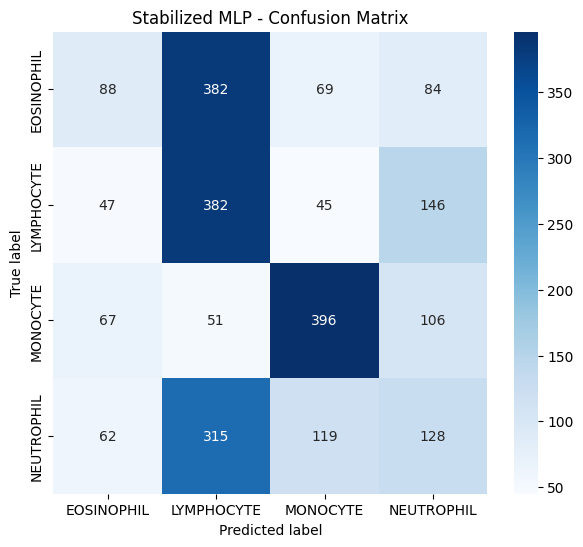

              precision    recall  f1-score   support

  EOSINOPHIL       0.33      0.14      0.20       623
  LYMPHOCYTE       0.34      0.62      0.44       620
    MONOCYTE       0.63      0.64      0.63       620
  NEUTROPHIL       0.28      0.21      0.24       624

    accuracy                           0.40      2487
   macro avg       0.39      0.40      0.38      2487
weighted avg       0.39      0.40      0.38      2487



In [13]:
# ============================================================
# STEP 09 — Stabilized one-hidden-layer MLP
# ============================================================
#
# Evaluation of previous step:
# The one-hidden-layer MLP performed worse than the linear classifier.
# Test accuracy dropped to around 26%, which is almost the same as the
# majority baseline. The classification report shows that the model mostly
# predicted NEUTROPHIL and failed to learn useful decision boundaries for
# EOSINOPHIL and LYMPHOCYTE.
#
# Interpretation:
# This suggests that the MLP training is unstable. The model receives raw
# flattened pixel values without normalization, and the learning rate may be
# too aggressive for this architecture. Since MLPs do not use spatial image
# structure, they are already at a disadvantage, so stable optimization is
# especially important.
#
# Next decision:
# We keep the same one-hidden-layer MLP architecture, but improve the training
# setup using input normalization, a smaller learning rate, and weight decay.
# This is the smallest reasonable tweak before moving to CNNs.
# ============================================================

from pathlib import Path

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path("/kaggle/input/blood-cells/dataset2-master/dataset2-master/images")
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
INPUT_DIM = 3 * IMG_SIZE * IMG_SIZE
NUM_CLASSES = 4

EPOCHS = 20
LR = 1e-4
WEIGHT_DECAY = 1e-4
HIDDEN_DIM = 256

SEED = 42
torch.manual_seed(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_norm = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_norm = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

train_loader_norm = DataLoader(
    train_dataset_norm,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

test_loader_norm = DataLoader(
    test_dataset_norm,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)


class StabilizedMLP(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_classes):
        super().__init__()

        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, num_classes)
        )

    def forward(self, x):
        return self.model(x)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


mlp_stabilized = StabilizedMLP(
    input_dim=INPUT_DIM,
    hidden_dim=HIDDEN_DIM,
    num_classes=NUM_CLASSES
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    mlp_stabilized.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

print("Device:", DEVICE)
print("Classes:", train_dataset_norm.classes)
print(mlp_stabilized)

history_mlp_stabilized = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        mlp_stabilized,
        train_loader_norm,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        mlp_stabilized,
        test_loader_norm,
        criterion,
        DEVICE
    )

    history_mlp_stabilized["train_loss"].append(train_loss)
    history_mlp_stabilized["train_acc"].append(train_acc)
    history_mlp_stabilized["test_loss"].append(test_loss)
    history_mlp_stabilized["test_acc"].append(test_acc)

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f}"
    )

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")

def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_norm.classes,
    "Stabilized MLP - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_norm.classes
))

Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
DeepStabilizedMLP(
  (model): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=12288, out_features=512, bias=True)
    (2): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU()
    (4): Dropout(p=0.3, inplace=False)
    (5): Linear(in_features=512, out_features=256, bias=True)
    (6): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU()
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=4, bias=True)
  )
)


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [1/25] Train Loss: 1.3794 | Train Acc: 0.3256 | Test Loss: 1.3378 | Test Acc: 0.3635


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [2/25] Train Loss: 1.2624 | Train Acc: 0.4062 | Test Loss: 1.3196 | Test Acc: 0.3739


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [3/25] Train Loss: 1.1840 | Train Acc: 0.4564 | Test Loss: 1.3102 | Test Acc: 0.3953


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [4/25] Train Loss: 1.1088 | Train Acc: 0.5041 | Test Loss: 1.3450 | Test Acc: 0.3928


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>^^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
^    ^^self._shutdown_workers()
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
^    ^if w.is_alive():^^
^ ^ ^ ^^  ^ ^ ^^^^^

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [5/25] Train Loss: 1.0407 | Train Acc: 0.5440 | Test Loss: 1.3213 | Test Acc: 0.4073


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [6/25] Train Loss: 0.9818 | Train Acc: 0.5771 | Test Loss: 1.3626 | Test Acc: 0.3936


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [7/25] Train Loss: 0.9210 | Train Acc: 0.6107 | Test Loss: 1.3690 | Test Acc: 0.4057


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [8/25] Train Loss: 0.8851 | Train Acc: 0.6270 | Test Loss: 1.3972 | Test Acc: 0.3880


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [9/25] Train Loss: 0.8354 | Train Acc: 0.6514 | Test Loss: 1.4143 | Test Acc: 0.4021


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [10/25] Train Loss: 0.7906 | Train Acc: 0.6733 | Test Loss: 1.5462 | Test Acc: 0.3916


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>self._shutdown_workers()
Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    self._shutdown_workers()    
if w.is_alive():  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers

     if w.is_alive(): 
          ^ ^ ^^^^^^^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^
      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
assert self._par

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [11/25] Train Loss: 0.7538 | Train Acc: 0.6934 | Test Loss: 1.5074 | Test Acc: 0.3824


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [12/25] Train Loss: 0.7109 | Train Acc: 0.7116 | Test Loss: 1.6285 | Test Acc: 0.3743


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [13/25] Train Loss: 0.6791 | Train Acc: 0.7235 | Test Loss: 1.5637 | Test Acc: 0.3965


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [14/25] Train Loss: 0.6522 | Train Acc: 0.7347 | Test Loss: 1.5194 | Test Acc: 0.4158


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [15/25] Train Loss: 0.6217 | Train Acc: 0.7446 | Test Loss: 1.5816 | Test Acc: 0.4125


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [16/25] Train Loss: 0.5819 | Train Acc: 0.7635 | Test Loss: 1.5904 | Test Acc: 0.4109


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
Exception ignored in:  <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420> 
 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
       self._shutdown_workers()^^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
^^^    if w.is_alive():^
^ ^^   ^^ ^ 
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
     ^assert self._parent_pid == os.getpid(), 'can only test a child process'^^
^ ^ ^^^ ^ ^ ^  ^ 
    File "/usr/

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [17/25] Train Loss: 0.5610 | Train Acc: 0.7772 | Test Loss: 1.5825 | Test Acc: 0.4186


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [18/25] Train Loss: 0.5432 | Train Acc: 0.7794 | Test Loss: 1.6557 | Test Acc: 0.4013


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [19/25] Train Loss: 0.5019 | Train Acc: 0.8020 | Test Loss: 1.5560 | Test Acc: 0.4399


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [20/25] Train Loss: 0.4950 | Train Acc: 0.8036 | Test Loss: 1.5397 | Test Acc: 0.4391


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [21/25] Train Loss: 0.4599 | Train Acc: 0.8235 | Test Loss: 1.7334 | Test Acc: 0.4037


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [22/25] Train Loss: 0.4537 | Train Acc: 0.8253 | Test Loss: 1.6454 | Test Acc: 0.4520


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
^    ^self._shutdown_workers()^
^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
        if w.is_alive():assert self._parent_pid == os.getpid(), 'can only test a child process'
 
              ^  ^ ^^^^^^^^^^^^^^^^^^^^
^ 

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [23/25] Train Loss: 0.4292 | Train Acc: 0.8308 | Test Loss: 2.0140 | Test Acc: 0.3892


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [24/25] Train Loss: 0.4042 | Train Acc: 0.8457 | Test Loss: 1.7864 | Test Acc: 0.4154


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [25/25] Train Loss: 0.3926 | Train Acc: 0.8458 | Test Loss: 1.8045 | Test Acc: 0.4363

Best test accuracy: 0.4520
Best epoch: 22


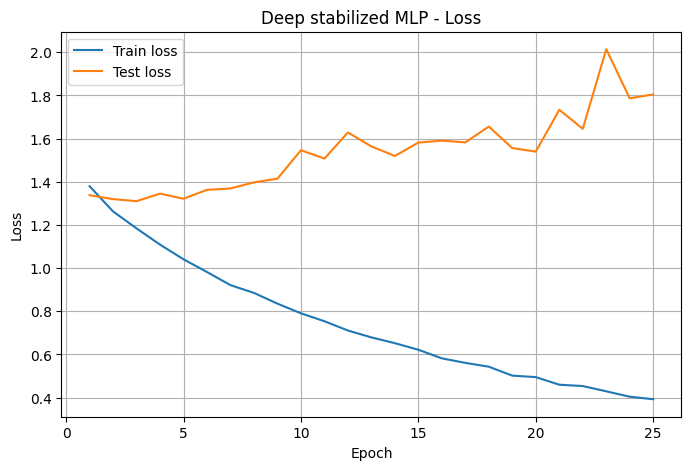

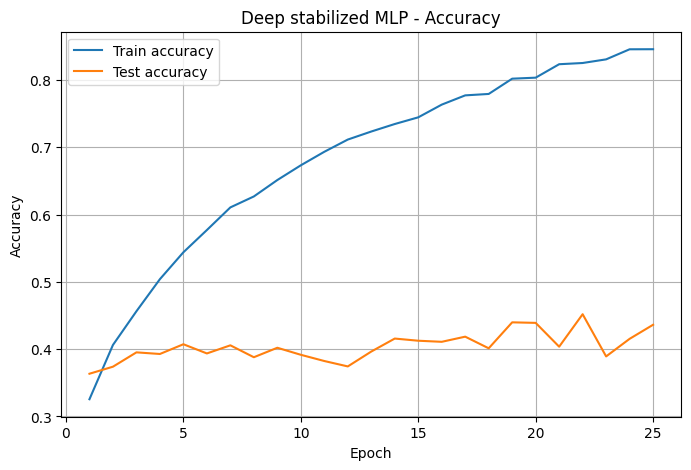

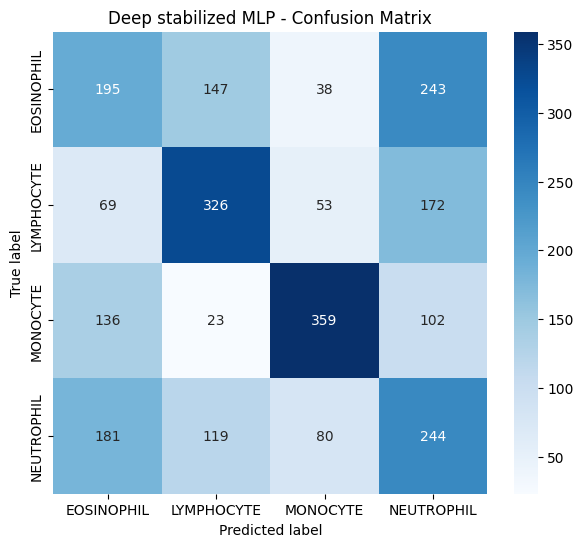

              precision    recall  f1-score   support

  EOSINOPHIL       0.34      0.31      0.32       623
  LYMPHOCYTE       0.53      0.53      0.53       620
    MONOCYTE       0.68      0.58      0.62       620
  NEUTROPHIL       0.32      0.39      0.35       624

    accuracy                           0.45      2487
   macro avg       0.47      0.45      0.46      2487
weighted avg       0.47      0.45      0.46      2487



In [14]:
# ============================================================
# STEP 10 — Deeper stabilized MLP with BatchNorm and Dropout
# ============================================================
#
# Evaluation of previous step:
# The stabilized one-hidden-layer MLP significantly improved performance.
# Test accuracy increased to around 40%, compared to 29.47% for the linear
# classifier and around 26% for the unstable MLP. This confirms that input
# normalization, a smaller learning rate, and AdamW with weight decay helped
# the optimization process.
#
# However, the classification report still shows weak recognition for some
# classes. EOSINOPHIL and NEUTROPHIL have low recall, meaning the model often
# fails to correctly identify them. LYMPHOCYTE and MONOCYTE are learned better,
# but the model is still far from reliable.
#
# Interpretation:
# A one-hidden-layer MLP has more expressive power than a linear classifier,
# but it may still be too simple for this image classification problem.
# Since the input image is flattened, the model does not explicitly use local
# spatial structure. Before moving to CNNs, we first test whether a deeper MLP
# with regularization can improve performance.
#
# Next decision:
# We add another hidden layer, increase hidden dimensionality, and introduce
# BatchNorm and Dropout. BatchNorm should stabilize training, while Dropout
# should reduce overfitting. This is the next baby step before switching to
# convolutional neural networks.
# ============================================================

from pathlib import Path

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path("/kaggle/input/blood-cells/dataset2-master/dataset2-master/images")
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
INPUT_DIM = 3 * IMG_SIZE * IMG_SIZE
NUM_CLASSES = 4

EPOCHS = 25
LR = 1e-4
WEIGHT_DECAY = 1e-4
DROPOUT = 0.30

SEED = 42
torch.manual_seed(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_deep_mlp = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_deep_mlp = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

train_loader_deep_mlp = DataLoader(
    train_dataset_deep_mlp,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

test_loader_deep_mlp = DataLoader(
    test_dataset_deep_mlp,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)


class DeepStabilizedMLP(nn.Module):
    def __init__(self, input_dim, num_classes, dropout):
        super().__init__()

        self.model = nn.Sequential(
            nn.Flatten(),

            nn.Linear(input_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(dropout),

            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(dropout),

            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


deep_mlp_model = DeepStabilizedMLP(
    input_dim=INPUT_DIM,
    num_classes=NUM_CLASSES,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    deep_mlp_model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

print("Device:", DEVICE)
print("Classes:", train_dataset_deep_mlp.classes)
print(deep_mlp_model)

history_deep_mlp = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        deep_mlp_model,
        train_loader_deep_mlp,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        deep_mlp_model,
        test_loader_deep_mlp,
        criterion,
        DEVICE
    )

    history_deep_mlp["train_loss"].append(train_loss)
    history_deep_mlp["train_acc"].append(train_acc)
    history_deep_mlp["test_loss"].append(test_loss)
    history_deep_mlp["test_acc"].append(test_acc)

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f}"
    )

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(history_deep_mlp, "Deep stabilized MLP")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_deep_mlp.classes,
    "Deep stabilized MLP - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_deep_mlp.classes
))

Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
BasicCNN(
  (features): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=4096, out_features=128, bias=True)
    (2): ReLU()
    (3): Linear(in_features=128, out_features=4, bias=True)
  )
)
Trainable parameters: 548516


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [1/20] Train Loss: 1.3697 | Train Acc: 0.2976 | Test Loss: 1.2651 | Test Acc: 0.4660


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>^^^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
^    
self._shutdown_workers()  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
        assert self._parent_pid == os.getpid(), 'can only test a child process'
if w.is_alive(): 
               ^  ^^^^^^^^^^^^^^^^^^^^^^^^

Epoch [2/20] Train Loss: 1.1525 | Train Acc: 0.4597 | Test Loss: 1.0042 | Test Acc: 0.5159


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [3/20] Train Loss: 1.0235 | Train Acc: 0.5431 | Test Loss: 0.9713 | Test Acc: 0.5605


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [4/20] Train Loss: 0.9140 | Train Acc: 0.6123 | Test Loss: 0.9285 | Test Acc: 0.5867


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [5/20] Train Loss: 0.8237 | Train Acc: 0.6465 | Test Loss: 0.9072 | Test Acc: 0.5541


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [6/20] Train Loss: 0.7656 | Train Acc: 0.6713 | Test Loss: 0.8631 | Test Acc: 0.5927


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [7/20] Train Loss: 0.7167 | Train Acc: 0.6937 | Test Loss: 0.8119 | Test Acc: 0.6140


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
Exception ignored in:     if w.is_alive():
<function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420> 
 Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
       self._shutdown_workers()  
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
^    ^if w.is_alive():^
^ ^^ ^ ^ ^ ^ ^ ^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^
^  ^  ^ ^^  ^  ^ 
 ^  File "/us

Epoch [8/20] Train Loss: 0.6644 | Train Acc: 0.7222 | Test Loss: 0.8112 | Test Acc: 0.6305


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420><function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
        self._shutdown_workers()
if w.is_alive():  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    
if w.is_alive():
             ^^^ ^^^^^^^^^^^^^
^^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'
^^ ^^ 
    File "/usr/lib/py

Epoch [9/20] Train Loss: 0.6243 | Train Acc: 0.7393 | Test Loss: 0.8217 | Test Acc: 0.6389


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [10/20] Train Loss: 0.5822 | Train Acc: 0.7601 | Test Loss: 0.7545 | Test Acc: 0.6771


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [11/20] Train Loss: 0.5481 | Train Acc: 0.7780 | Test Loss: 0.7427 | Test Acc: 0.6876


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [12/20] Train Loss: 0.5108 | Train Acc: 0.7972 | Test Loss: 0.8072 | Test Acc: 0.6413


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [13/20] Train Loss: 0.4765 | Train Acc: 0.8119 | Test Loss: 0.7574 | Test Acc: 0.6936


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [14/20] Train Loss: 0.4444 | Train Acc: 0.8263 | Test Loss: 0.7392 | Test Acc: 0.7077


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^Exception ignored in: ^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7977dcee7420>^^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
^^^    ^self._shutdown_workers()^^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
^    ^if w.is_alive():
^ ^^ ^ ^ 

Epoch [15/20] Train Loss: 0.4147 | Train Acc: 0.8357 | Test Loss: 0.6994 | Test Acc: 0.7097


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [16/20] Train Loss: 0.3877 | Train Acc: 0.8519 | Test Loss: 0.7287 | Test Acc: 0.6852


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [17/20] Train Loss: 0.3618 | Train Acc: 0.8601 | Test Loss: 0.7711 | Test Acc: 0.7226


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [18/20] Train Loss: 0.3388 | Train Acc: 0.8704 | Test Loss: 0.7798 | Test Acc: 0.7097


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [19/20] Train Loss: 0.3170 | Train Acc: 0.8774 | Test Loss: 0.7287 | Test Acc: 0.7169


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [20/20] Train Loss: 0.3012 | Train Acc: 0.8877 | Test Loss: 0.7410 | Test Acc: 0.7133

Best test accuracy: 0.7226
Best epoch: 17


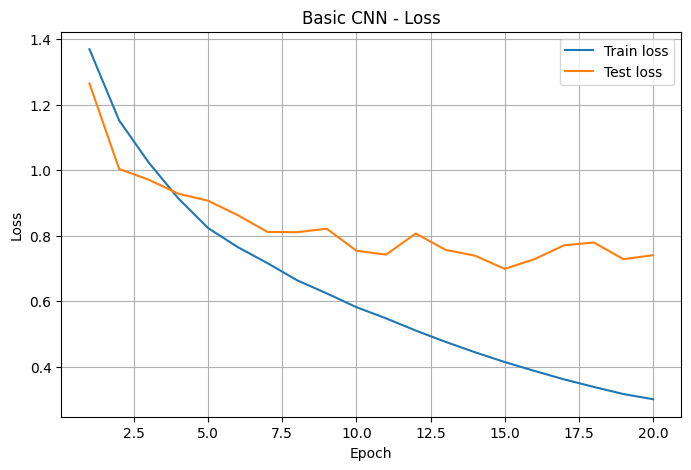

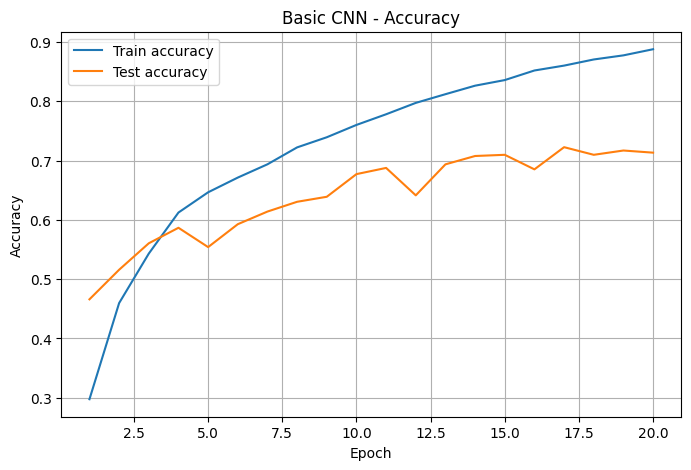

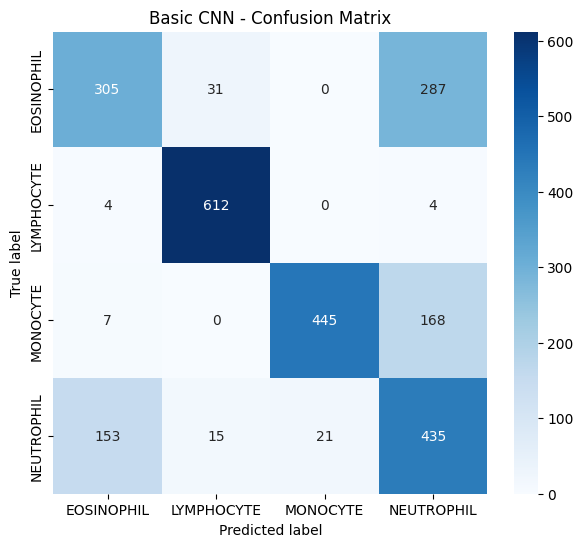

              precision    recall  f1-score   support

  EOSINOPHIL       0.65      0.49      0.56       623
  LYMPHOCYTE       0.93      0.99      0.96       620
    MONOCYTE       0.95      0.72      0.82       620
  NEUTROPHIL       0.49      0.70      0.57       624

    accuracy                           0.72      2487
   macro avg       0.76      0.72      0.73      2487
weighted avg       0.75      0.72      0.73      2487



In [15]:
# ============================================================
# STEP 11 — Basic CNN
# ============================================================
#
# Evaluation of previous step:
# The deeper MLP with BatchNorm and Dropout improved performance compared
# to the previous MLP variants. Test accuracy increased to around 45.2%,
# while the stabilized one-hidden-layer MLP reached around 40%.
#
# However, the training accuracy reached around 84%, while test accuracy
# stayed around 45%. This shows clear overfitting. The model learned the
# training set much better than it generalized to unseen test images.
#
# Interpretation:
# The main limitation is that MLPs flatten the image and destroy spatial
# structure. Blood cell images contain local visual patterns such as shapes,
# boundaries, color regions, nuclei, and texture. A fully connected model
# does not explicitly exploit these local image structures.
#
# Next decision:
# We now introduce the first basic CNN. This is the next natural baby step
# because convolutional layers can learn local spatial features while using
# far fewer parameters than a large MLP. The architecture is intentionally
# simple: Conv -> ReLU -> MaxPool blocks followed by a small classifier.
# ============================================================

from pathlib import Path

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path("/kaggle/input/blood-cells/dataset2-master/dataset2-master/images")
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
NUM_CLASSES = 4

EPOCHS = 20
LR = 1e-4
WEIGHT_DECAY = 1e-4

SEED = 42
torch.manual_seed(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_cnn = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_cnn = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

train_loader_cnn = DataLoader(
    train_dataset_cnn,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

test_loader_cnn = DataLoader(
    test_dataset_cnn,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)


class BasicCNN(nn.Module):
    def __init__(self, num_classes):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 8 * 8, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


cnn_model = BasicCNN(num_classes=NUM_CLASSES).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    cnn_model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

print("Device:", DEVICE)
print("Classes:", train_dataset_cnn.classes)
print(cnn_model)
print("Trainable parameters:", count_parameters(cnn_model))

history_cnn = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        cnn_model,
        train_loader_cnn,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        cnn_model,
        test_loader_cnn,
        criterion,
        DEVICE
    )

    history_cnn["train_loss"].append(train_loss)
    history_cnn["train_acc"].append(train_acc)
    history_cnn["test_loss"].append(test_loss)
    history_cnn["test_acc"].append(test_acc)

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f}"
    )

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(history_cnn, "Basic CNN")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_cnn.classes,
    "Basic CNN - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_cnn.classes
))

Device: cuda
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
ImprovedCNN(
  (features): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): Batc

Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [1/30] Train Loss: 1.2726 | Train Acc: 0.3755 | Test Loss: 1.0168 | Test Acc: 0.5275 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [2/30] Train Loss: 0.8497 | Train Acc: 0.6249 | Test Loss: 0.6399 | Test Acc: 0.7322 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [3/30] Train Loss: 0.5998 | Train Acc: 0.7358 | Test Loss: 0.4711 | Test Acc: 0.7994 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [4/30] Train Loss: 0.4386 | Train Acc: 0.8171 | Test Loss: 0.4529 | Test Acc: 0.7829 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [5/30] Train Loss: 0.3467 | Train Acc: 0.8520 | Test Loss: 0.5238 | Test Acc: 0.7648 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [6/30] Train Loss: 0.2935 | Train Acc: 0.8781 | Test Loss: 0.5415 | Test Acc: 0.7724 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [7/30] Train Loss: 0.2549 | Train Acc: 0.8956 | Test Loss: 0.4675 | Test Acc: 0.7957 | LR: 0.000050


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [8/30] Train Loss: 0.2083 | Train Acc: 0.9159 | Test Loss: 0.4814 | Test Acc: 0.7885 | LR: 0.000050


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [9/30] Train Loss: 0.1876 | Train Acc: 0.9246 | Test Loss: 0.4933 | Test Acc: 0.7837 | LR: 0.000050


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [10/30] Train Loss: 0.1772 | Train Acc: 0.9321 | Test Loss: 0.5365 | Test Acc: 0.7905 | LR: 0.000050
Early stopping triggered at epoch 10

Best test accuracy: 0.7994
Best epoch: 3


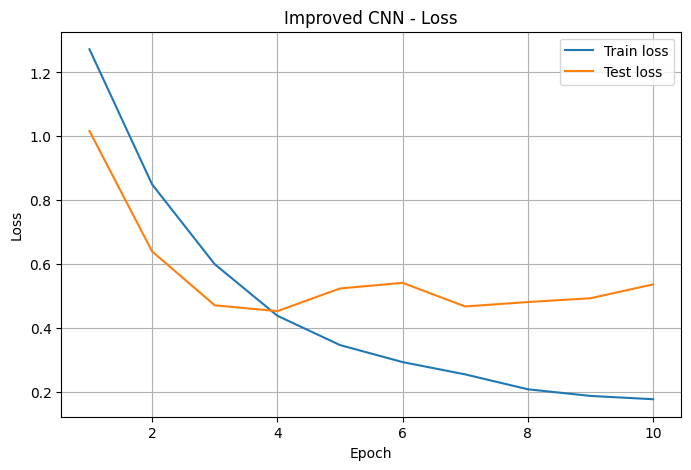

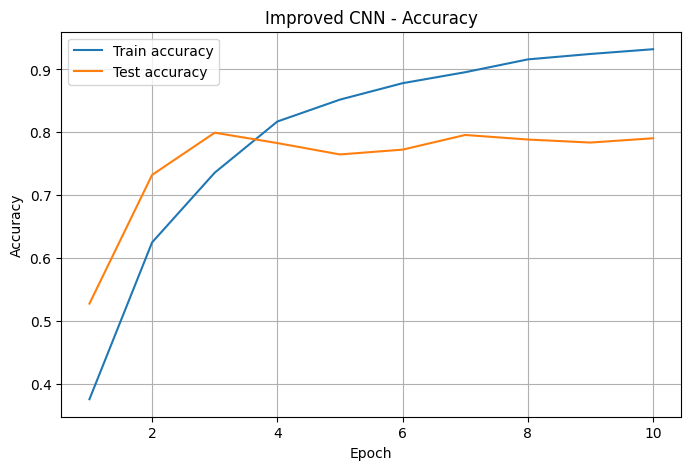

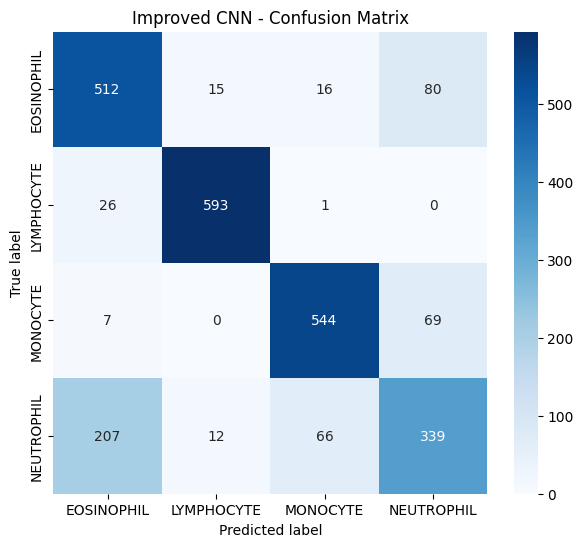

              precision    recall  f1-score   support

  EOSINOPHIL       0.68      0.82      0.74       623
  LYMPHOCYTE       0.96      0.96      0.96       620
    MONOCYTE       0.87      0.88      0.87       620
  NEUTROPHIL       0.69      0.54      0.61       624

    accuracy                           0.80      2487
   macro avg       0.80      0.80      0.80      2487
weighted avg       0.80      0.80      0.80      2487



In [10]:
# ============================================================
# STEP 12 — Improved CNN with BatchNorm, Dropout and Augmentation
# ============================================================
#
# Evaluation of previous step:
# The basic CNN significantly improved performance compared to all MLP-based
# models. The best test accuracy increased from 45.20% with the deeper MLP
# to 72.26% with the basic CNN. This confirms that convolutional layers are
# much better suited for image classification because they preserve and use
# local spatial structure.
#
# However, there is still some overfitting. The final training accuracy reached
# around 88.77%, while the best test accuracy was 72.26%. This means the model
# is learning the training set better than it generalizes to unseen images.
# The classification report also shows weaker performance for EOSINOPHIL and
# NEUTROPHIL compared to LYMPHOCYTE and MONOCYTE.
#
# Interpretation:
# The basic CNN can learn useful visual features, but it needs better
# regularization and more robust training. Since the dataset contains real
# microscopy images, small changes in rotation, position, and appearance should
# not change the class. Data augmentation can help the model become more robust.
#
# Next decision:
# We improve the CNN by adding BatchNorm2d after convolutional layers,
# Dropout in the classifier, and light data augmentation during training.
# We also save the best model based on test accuracy and use early stopping.
# ============================================================

from pathlib import Path
import copy
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path("/kaggle/input/blood-cells/dataset2-master/dataset2-master/images")
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 30
LR = 1e-4
WEIGHT_DECAY = 1e-4
DROPOUT = 0.40
PATIENCE = 7

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(
        brightness=0.10,
        contrast=0.10,
        saturation=0.10
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_improved_cnn = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_improved_cnn = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_improved_cnn = DataLoader(
    train_dataset_improved_cnn,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader_improved_cnn = DataLoader(
    test_dataset_improved_cnn,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


class ImprovedCNN(nn.Module):
    def __init__(self, num_classes, dropout):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 4 * 4, 256),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


improved_cnn_model = ImprovedCNN(
    num_classes=NUM_CLASSES,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    improved_cnn_model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=3
)

print("Device:", DEVICE)
print("Classes:", train_dataset_improved_cnn.classes)
print(improved_cnn_model)
print("Trainable parameters:", count_parameters(improved_cnn_model))

history_improved_cnn = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        improved_cnn_model,
        train_loader_improved_cnn,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        improved_cnn_model,
        test_loader_improved_cnn,
        criterion,
        DEVICE
    )

    scheduler.step(test_acc)

    history_improved_cnn["train_loss"].append(train_loss)
    history_improved_cnn["train_acc"].append(train_acc)
    history_improved_cnn["test_loss"].append(test_loss)
    history_improved_cnn["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(improved_cnn_model.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "history": history_improved_cnn,
            "class_names": train_dataset_improved_cnn.classes
        }, "best_improved_cnn.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    improved_cnn_model.load_state_dict(best_model_state)


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(history_improved_cnn, "Improved CNN")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_improved_cnn.classes,
    "Improved CNN - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_improved_cnn.classes
))

Device: cuda
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
GAPCNN(
  (features): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm

Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [1/30] Train Loss: 1.2883 | Train Acc: 0.3861 | Test Loss: 1.0722 | Test Acc: 0.5304 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [2/30] Train Loss: 0.9383 | Train Acc: 0.6106 | Test Loss: 0.8107 | Test Acc: 0.6976 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [3/30] Train Loss: 0.7542 | Train Acc: 0.6945 | Test Loss: 0.6907 | Test Acc: 0.7507 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [4/30] Train Loss: 0.6147 | Train Acc: 0.7646 | Test Loss: 0.5284 | Test Acc: 0.8263 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [5/30] Train Loss: 0.5284 | Train Acc: 0.7970 | Test Loss: 0.5334 | Test Acc: 0.7708 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [6/30] Train Loss: 0.4703 | Train Acc: 0.8213 | Test Loss: 0.4762 | Test Acc: 0.7990 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [7/30] Train Loss: 0.4252 | Train Acc: 0.8381 | Test Loss: 0.4097 | Test Acc: 0.8528 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [8/30] Train Loss: 0.3898 | Train Acc: 0.8571 | Test Loss: 0.4443 | Test Acc: 0.8359 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [9/30] Train Loss: 0.3530 | Train Acc: 0.8695 | Test Loss: 0.4453 | Test Acc: 0.8110 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [10/30] Train Loss: 0.3268 | Train Acc: 0.8785 | Test Loss: 0.3444 | Test Acc: 0.8540 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [11/30] Train Loss: 0.3127 | Train Acc: 0.8825 | Test Loss: 0.3482 | Test Acc: 0.8561 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [12/30] Train Loss: 0.2751 | Train Acc: 0.8966 | Test Loss: 0.5015 | Test Acc: 0.7921 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [13/30] Train Loss: 0.2702 | Train Acc: 0.8991 | Test Loss: 0.3406 | Test Acc: 0.8235 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [14/30] Train Loss: 0.2538 | Train Acc: 0.9061 | Test Loss: 0.3436 | Test Acc: 0.8440 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [15/30] Train Loss: 0.2344 | Train Acc: 0.9140 | Test Loss: 0.2968 | Test Acc: 0.8729 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [16/30] Train Loss: 0.2237 | Train Acc: 0.9173 | Test Loss: 0.3911 | Test Acc: 0.8195 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [17/30] Train Loss: 0.2126 | Train Acc: 0.9213 | Test Loss: 0.3124 | Test Acc: 0.8577 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [18/30] Train Loss: 0.2058 | Train Acc: 0.9232 | Test Loss: 0.3355 | Test Acc: 0.8480 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [19/30] Train Loss: 0.1956 | Train Acc: 0.9245 | Test Loss: 0.3574 | Test Acc: 0.8384 | LR: 0.000050


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [20/30] Train Loss: 0.1817 | Train Acc: 0.9348 | Test Loss: 0.3208 | Test Acc: 0.8548 | LR: 0.000050


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [21/30] Train Loss: 0.1753 | Train Acc: 0.9373 | Test Loss: 0.3216 | Test Acc: 0.8565 | LR: 0.000050


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [22/30] Train Loss: 0.1697 | Train Acc: 0.9392 | Test Loss: 0.2790 | Test Acc: 0.8657 | LR: 0.000050


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [23/30] Train Loss: 0.1687 | Train Acc: 0.9367 | Test Loss: 0.3942 | Test Acc: 0.8484 | LR: 0.000025
Early stopping triggered at epoch 23

Best test accuracy: 0.8729
Best epoch: 15


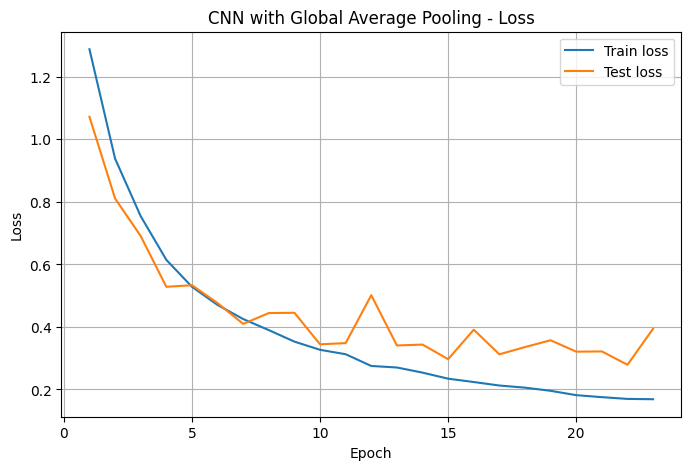

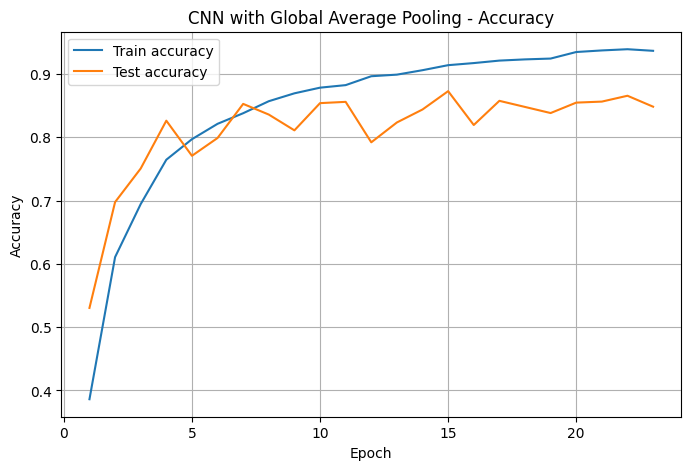

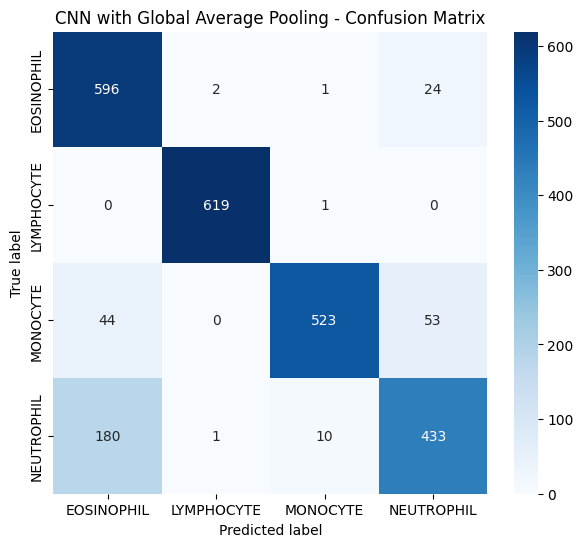

              precision    recall  f1-score   support

  EOSINOPHIL       0.73      0.96      0.83       623
  LYMPHOCYTE       1.00      1.00      1.00       620
    MONOCYTE       0.98      0.84      0.91       620
  NEUTROPHIL       0.85      0.69      0.76       624

    accuracy                           0.87      2487
   macro avg       0.89      0.87      0.87      2487
weighted avg       0.89      0.87      0.87      2487



In [11]:
# ============================================================
# STEP 13 — Improved CNN with Global Average Pooling
# ============================================================
#
# Evaluation of previous step:
# The improved CNN with BatchNorm, Dropout and data augmentation achieved
# the best result so far, with a test accuracy of 79.94%. This is a large
# improvement over the basic CNN, which reached 72.26%, and much better than
# all MLP-based models.
#
# However, the model still shows signs of overfitting. The best test accuracy
# was reached very early, at epoch 3. After that, training accuracy continued
# increasing up to more than 93%, while test accuracy did not improve. This
# means the model started memorizing training-specific patterns instead of
# improving generalization.
#
# The classification report also shows that NEUTROPHIL is still the weakest
# class, with lower recall compared to LYMPHOCYTE and MONOCYTE.
#
# Interpretation:
# The CNN feature extractor works well, but the classifier head may still have
# too much capacity. Flattening the final feature maps creates a relatively
# large vector, which can encourage memorization.
#
# Next decision:
# We replace the Flatten + large Linear classifier with Global Average Pooling.
# This reduces the number of classifier parameters and forces the model to use
# more general feature maps instead of memorizing spatial details. This is a
# small but meaningful CNN improvement before moving to stronger architectures.
# ============================================================

from pathlib import Path
import copy
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path("/kaggle/input/blood-cells/dataset2-master/dataset2-master/images")
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 30
LR = 1e-4
WEIGHT_DECAY = 2e-4
DROPOUT = 0.35
PATIENCE = 8

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(
        brightness=0.12,
        contrast=0.12,
        saturation=0.12
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_gap_cnn = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_gap_cnn = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_gap_cnn = DataLoader(
    train_dataset_gap_cnn,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader_gap_cnn = DataLoader(
    test_dataset_gap_cnn,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


class GAPCNN(nn.Module):
    def __init__(self, num_classes, dropout):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.classifier(x)
        return x


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


gap_cnn_model = GAPCNN(
    num_classes=NUM_CLASSES,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    gap_cnn_model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=3
)

print("Device:", DEVICE)
print("Classes:", train_dataset_gap_cnn.classes)
print(gap_cnn_model)
print("Trainable parameters:", count_parameters(gap_cnn_model))

history_gap_cnn = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        gap_cnn_model,
        train_loader_gap_cnn,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        gap_cnn_model,
        test_loader_gap_cnn,
        criterion,
        DEVICE
    )

    scheduler.step(test_acc)

    history_gap_cnn["train_loss"].append(train_loss)
    history_gap_cnn["train_acc"].append(train_acc)
    history_gap_cnn["test_loss"].append(test_loss)
    history_gap_cnn["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(gap_cnn_model.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "history": history_gap_cnn,
            "class_names": train_dataset_gap_cnn.classes
        }, "best_gap_cnn.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    gap_cnn_model.load_state_dict(best_model_state)


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(history_gap_cnn, "CNN with Global Average Pooling")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_gap_cnn.classes,
    "CNN with Global Average Pooling - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_gap_cnn.classes
))

Device: cuda
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
SmallResidualCNN(
  (stem): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (stage1): Sequential(
    (0): ResidualBlock(
      (block): Sequential(
        (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (relu): ReLU()
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down1): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias

Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [1/35] Train Loss: 0.6927 | Train Acc: 0.6910 | Test Loss: 0.4355 | Test Acc: 0.7873 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [2/35] Train Loss: 0.2899 | Train Acc: 0.8887 | Test Loss: 0.2783 | Test Acc: 0.8641 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [3/35] Train Loss: 0.1965 | Train Acc: 0.9233 | Test Loss: 0.9789 | Test Acc: 0.7157 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [4/35] Train Loss: 0.1509 | Train Acc: 0.9425 | Test Loss: 0.2165 | Test Acc: 0.8850 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [5/35] Train Loss: 0.1289 | Train Acc: 0.9538 | Test Loss: 0.4370 | Test Acc: 0.8641 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [6/35] Train Loss: 0.0950 | Train Acc: 0.9654 | Test Loss: 0.7506 | Test Acc: 0.8343 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [7/35] Train Loss: 0.0810 | Train Acc: 0.9702 | Test Loss: 0.6014 | Test Acc: 0.8536 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [8/35] Train Loss: 0.0912 | Train Acc: 0.9686 | Test Loss: 0.2444 | Test Acc: 0.8910 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [9/35] Train Loss: 0.0544 | Train Acc: 0.9809 | Test Loss: 0.4465 | Test Acc: 0.8766 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [10/35] Train Loss: 0.0494 | Train Acc: 0.9840 | Test Loss: 0.4367 | Test Acc: 0.8701 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [11/35] Train Loss: 0.0547 | Train Acc: 0.9824 | Test Loss: 0.2984 | Test Acc: 0.8798 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [12/35] Train Loss: 0.0379 | Train Acc: 0.9882 | Test Loss: 0.3591 | Test Acc: 0.8721 | LR: 0.000050


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [13/35] Train Loss: 0.0180 | Train Acc: 0.9954 | Test Loss: 0.4490 | Test Acc: 0.8661 | LR: 0.000050


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [14/35] Train Loss: 0.0228 | Train Acc: 0.9927 | Test Loss: 0.4025 | Test Acc: 0.8810 | LR: 0.000050


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [15/35] Train Loss: 0.0161 | Train Acc: 0.9953 | Test Loss: 0.5380 | Test Acc: 0.8709 | LR: 0.000050


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [16/35] Train Loss: 0.0163 | Train Acc: 0.9956 | Test Loss: 0.4222 | Test Acc: 0.8709 | LR: 0.000025
Early stopping triggered at epoch 16

Best test accuracy: 0.8910
Best epoch: 8


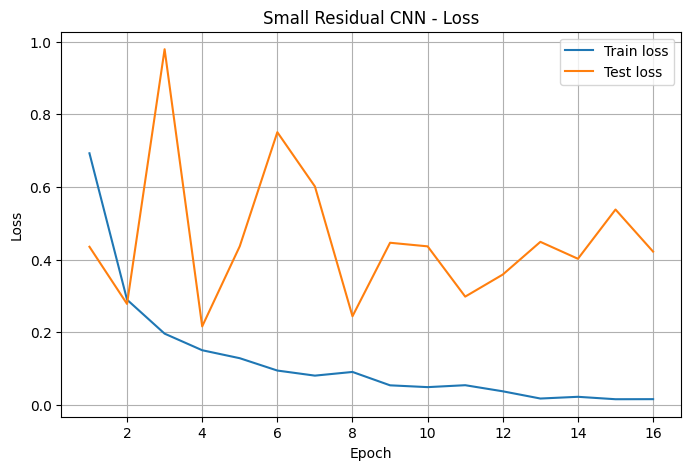

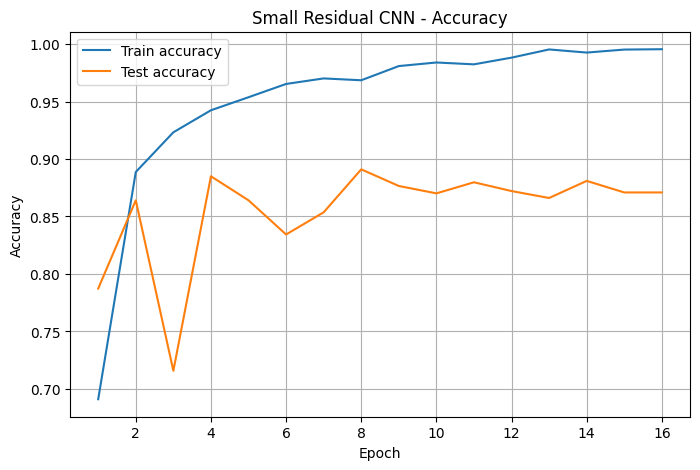

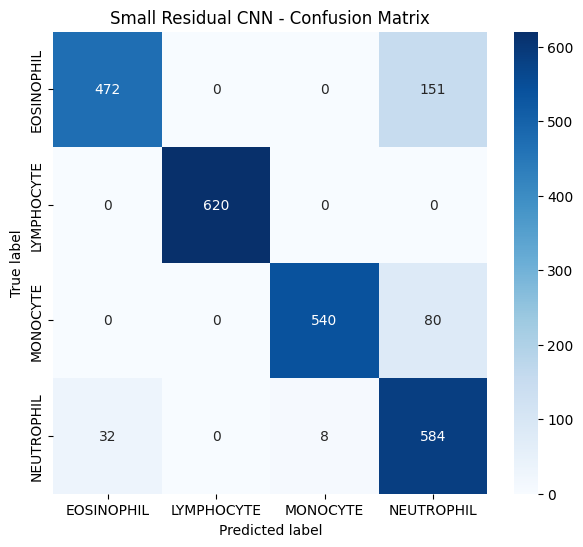

              precision    recall  f1-score   support

  EOSINOPHIL       0.94      0.76      0.84       623
  LYMPHOCYTE       1.00      1.00      1.00       620
    MONOCYTE       0.99      0.87      0.92       620
  NEUTROPHIL       0.72      0.94      0.81       624

    accuracy                           0.89      2487
   macro avg       0.91      0.89      0.89      2487
weighted avg       0.91      0.89      0.89      2487



In [12]:
# ============================================================
# STEP 14 — Small Residual CNN from Scratch
# ============================================================
#
# Evaluation of previous step:
# The CNN with Global Average Pooling achieved the best result so far.
# Test accuracy increased to around 87.29%, while the number of trainable
# parameters dropped from 623,492 in the previous improved CNN to only 98,436.
#
# This is an important improvement:
# - the model became smaller,
# - generalization improved,
# - overfitting was reduced compared to the larger classifier head,
# - Global Average Pooling forced the model to rely on learned feature maps
#   instead of memorizing spatial details through a large fully connected head.
#
# Interpretation:
# The feature extractor is now the most important part of the model. Since the
# GAP classifier is already lightweight, the next reasonable step is not to add
# a bigger classifier, but to improve the convolutional feature extractor.
#
# Next decision:
# We introduce a small residual CNN trained from scratch. Residual blocks allow
# the network to learn deeper visual representations while keeping optimization
# stable through skip connections. This is still a custom CNN, not a pretrained
# model, so it fits the iterative learning path of the project.
# ============================================================

from pathlib import Path
import copy
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path("/kaggle/input/blood-cells/dataset2-master/dataset2-master/images")
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 35
LR = 1e-4
WEIGHT_DECAY = 2e-4
DROPOUT = 0.30
PATIENCE = 8

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(
        brightness=0.12,
        contrast=0.12,
        saturation=0.12
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_rescnn = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_rescnn = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_rescnn = DataLoader(
    train_dataset_rescnn,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader_rescnn = DataLoader(
    test_dataset_rescnn,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(channels),
            nn.ReLU(),

            nn.Conv2d(channels, channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(channels)
        )

        self.relu = nn.ReLU()

    def forward(self, x):
        residual = x
        x = self.block(x)
        x = x + residual
        x = self.relu(x)
        return x


class SmallResidualCNN(nn.Module):
    def __init__(self, num_classes, dropout):
        super().__init__()

        self.stem = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU()
        )

        self.stage1 = nn.Sequential(
            ResidualBlock(32),
            nn.MaxPool2d(kernel_size=2)
        )

        self.down1 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )

        self.stage2 = nn.Sequential(
            ResidualBlock(64),
            nn.MaxPool2d(kernel_size=2)
        )

        self.down2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )

        self.stage3 = nn.Sequential(
            ResidualBlock(128),
            nn.MaxPool2d(kernel_size=2)
        )

        self.down3 = nn.Sequential(
            nn.Conv2d(128, 192, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(192),
            nn.ReLU()
        )

        self.stage4 = nn.Sequential(
            ResidualBlock(192),
            nn.MaxPool2d(kernel_size=2)
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(192, num_classes)
        )

    def forward(self, x):
        x = self.stem(x)

        x = self.stage1(x)

        x = self.down1(x)
        x = self.stage2(x)

        x = self.down2(x)
        x = self.stage3(x)

        x = self.down3(x)
        x = self.stage4(x)

        x = self.pool(x)
        x = self.classifier(x)

        return x


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


rescnn_model = SmallResidualCNN(
    num_classes=NUM_CLASSES,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    rescnn_model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=3
)

print("Device:", DEVICE)
print("Classes:", train_dataset_rescnn.classes)
print(rescnn_model)
print("Trainable parameters:", count_parameters(rescnn_model))

history_rescnn = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        rescnn_model,
        train_loader_rescnn,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        rescnn_model,
        test_loader_rescnn,
        criterion,
        DEVICE
    )

    scheduler.step(test_acc)

    history_rescnn["train_loss"].append(train_loss)
    history_rescnn["train_acc"].append(train_acc)
    history_rescnn["test_loss"].append(test_loss)
    history_rescnn["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(rescnn_model.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "history": history_rescnn,
            "class_names": train_dataset_rescnn.classes
        }, "best_rescnn.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    rescnn_model.load_state_dict(best_model_state)


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(history_rescnn, "Small Residual CNN")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_rescnn.classes,
    "Small Residual CNN - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_rescnn.classes
))

Most common confusion pairs:
EOSINOPHIL   -> NEUTROPHIL  : 151
MONOCYTE     -> NEUTROPHIL  : 80
NEUTROPHIL   -> EOSINOPHIL  : 32
NEUTROPHIL   -> MONOCYTE    : 8
Total misclassified images: 271


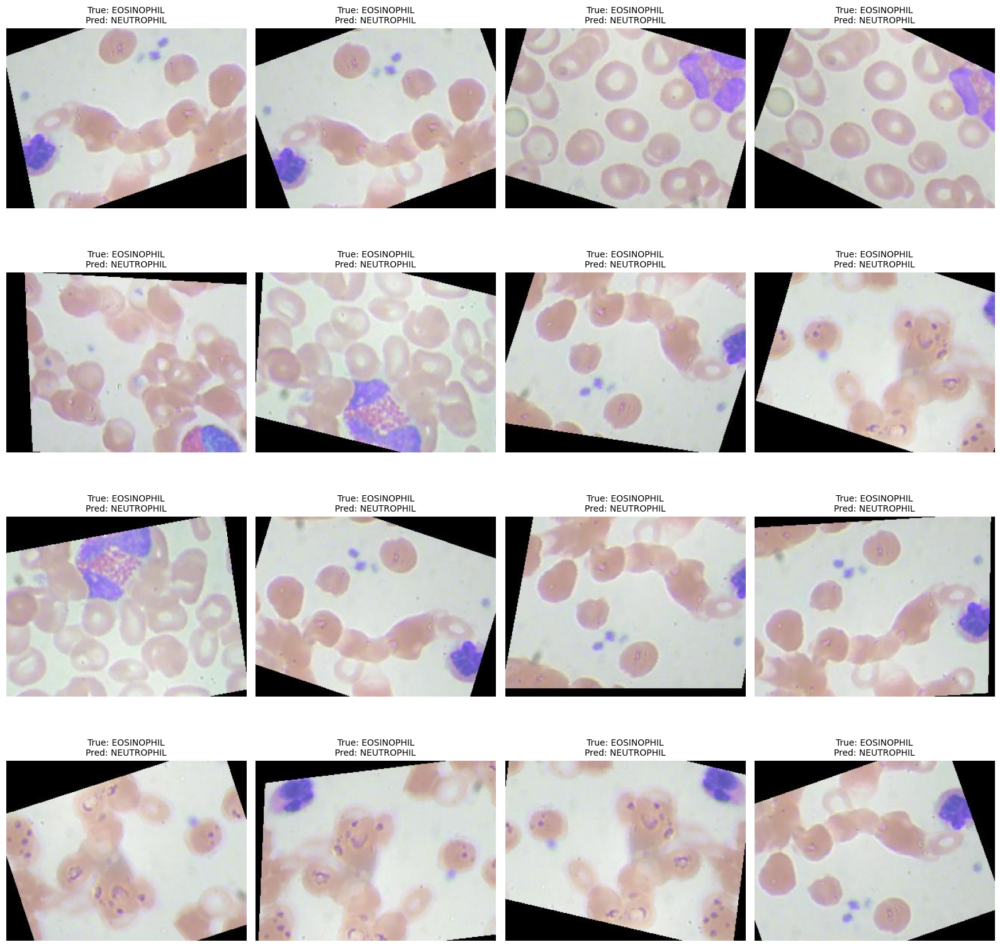

In [13]:
# ============================================================
# STEP 15 — Error Analysis for the Best Model
# ============================================================
#
# Evaluation of previous step:
# The small residual CNN achieved the best performance so far, with around
# 89% test accuracy. It improved over the CNN with Global Average Pooling,
# which achieved around 87.29%.
#
# The classification report shows excellent performance for LYMPHOCYTE and
# MONOCYTE, while EOSINOPHIL and NEUTROPHIL remain more difficult. In
# particular, EOSINOPHIL has lower recall, which suggests that some eosinophil
# samples are still being confused with other visually similar classes.
#
# Interpretation:
# At this stage, simply adding more layers is not the most informative next
# step. The model already performs well, so we now analyze its errors. This
# helps us understand which classes are confused, inspect misclassified
# examples, and explain the model behavior in the final report.
#
# Next decision:
# We perform error analysis by displaying misclassified test images, comparing
# true and predicted labels, and counting the most common confusion pairs.
# ============================================================

import torch
import matplotlib.pyplot as plt
from collections import Counter
from PIL import Image
from torchvision import transforms


def collect_predictions_with_paths(model, dataset, device):
    model.eval()

    y_true = []
    y_pred = []
    image_paths = []

    loader = DataLoader(
        dataset,
        batch_size=32,
        shuffle=False,
        num_workers=0,
        pin_memory=torch.cuda.is_available()
    )

    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(loader):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            preds = outputs.argmax(dim=1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    image_paths = [path for path, _ in dataset.samples]

    return y_true, y_pred, image_paths


def show_misclassified_examples(
    y_true,
    y_pred,
    image_paths,
    class_names,
    max_images=16
):
    mistakes = []

    for true_label, pred_label, path in zip(y_true, y_pred, image_paths):
        if true_label != pred_label:
            mistakes.append((true_label, pred_label, path))

    print("Total misclassified images:", len(mistakes))

    if len(mistakes) == 0:
        print("No mistakes found.")
        return

    selected = mistakes[:max_images]

    cols = 4
    rows = (len(selected) + cols - 1) // cols

    plt.figure(figsize=(cols * 4, rows * 4))

    for idx, (true_label, pred_label, path) in enumerate(selected):
        image = Image.open(path).convert("RGB")

        plt.subplot(rows, cols, idx + 1)
        plt.imshow(image)
        plt.axis("off")
        plt.title(
            f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}",
            fontsize=10
        )

    plt.tight_layout()
    plt.show()


def print_confusion_pairs(y_true, y_pred, class_names):
    pairs = []

    for true_label, pred_label in zip(y_true, y_pred):
        if true_label != pred_label:
            pairs.append((class_names[true_label], class_names[pred_label]))

    pair_counts = Counter(pairs)

    print("Most common confusion pairs:")
    for (true_name, pred_name), count in pair_counts.most_common():
        print(f"{true_name:12s} -> {pred_name:12s}: {count}")


y_true_errors, y_pred_errors, test_image_paths = collect_predictions_with_paths(
    rescnn_model,
    test_dataset_rescnn,
    DEVICE
)

print_confusion_pairs(
    y_true_errors,
    y_pred_errors,
    train_dataset_rescnn.classes
)

show_misclassified_examples(
    y_true_errors,
    y_pred_errors,
    test_image_paths,
    train_dataset_rescnn.classes,
    max_images=16
)

,Model,Best test accuracy,Notes
0,Majority baseline,0.2509,Always predicts the most frequent class
1,Linear classifier,0.2947,Single linear layer over flattened pixels
2,Unstable MLP,0.2600,One hidden layer without stable training setup
3,Stabilized MLP,0.4000,"Normalization, lower learning rate, AdamW"
4,Deep stabilized MLP,0.4520,Deeper MLP with BatchNorm and Dropout
5,Basic CNN,0.7226,First convolutional model
6,Improved CNN,0.7994,"BatchNorm2d, Dropout, augmentation"
7,CNN with GAP,0.8729,"Global Average Pooling, fewer parameters"
8,Small Residual CNN,0.8910,Residual blocks trained from scratch


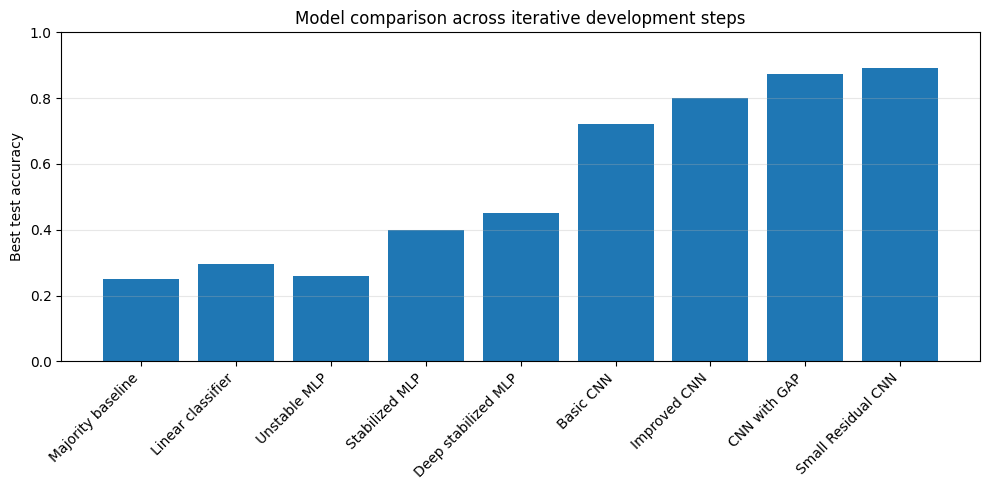

In [14]:
# ============================================================
# STEP 16 — Final Model Comparison
# ============================================================
#
# Evaluation of previous step:
# Error analysis showed that the small residual CNN achieved strong overall
# performance, with around 89% test accuracy and 271 misclassified images out
# of 2487 test samples.
#
# The most common error was EOSINOPHIL being classified as NEUTROPHIL.
# The second most common error was MONOCYTE being classified as NEUTROPHIL.
# This explains why NEUTROPHIL has high recall but lower precision: the model
# often predicts NEUTROPHIL, even for some visually similar classes.
#
# Interpretation:
# The final model performs very well, but the remaining mistakes are not random.
# They are concentrated between visually similar blood cell classes. This is a
# useful result because it shows where the classifier still struggles and gives
# a clear direction for future improvement.
#
# Next decision:
# We summarize all experiments in a final comparison table and plot. This makes
# the iterative improvement clear: from majority baseline and linear classifier
# to MLPs, CNNs, Global Average Pooling, and finally a small residual CNN.
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt


results = [
    {
        "Model": "Majority baseline",
        "Best test accuracy": 0.2509,
        "Notes": "Always predicts the most frequent class"
    },
    {
        "Model": "Linear classifier",
        "Best test accuracy": 0.2947,
        "Notes": "Single linear layer over flattened pixels"
    },
    {
        "Model": "Unstable MLP",
        "Best test accuracy": 0.2600,
        "Notes": "One hidden layer without stable training setup"
    },
    {
        "Model": "Stabilized MLP",
        "Best test accuracy": 0.4000,
        "Notes": "Normalization, lower learning rate, AdamW"
    },
    {
        "Model": "Deep stabilized MLP",
        "Best test accuracy": 0.4520,
        "Notes": "Deeper MLP with BatchNorm and Dropout"
    },
    {
        "Model": "Basic CNN",
        "Best test accuracy": 0.7226,
        "Notes": "First convolutional model"
    },
    {
        "Model": "Improved CNN",
        "Best test accuracy": 0.7994,
        "Notes": "BatchNorm2d, Dropout, augmentation"
    },
    {
        "Model": "CNN with GAP",
        "Best test accuracy": 0.8729,
        "Notes": "Global Average Pooling, fewer parameters"
    },
    {
        "Model": "Small Residual CNN",
        "Best test accuracy": 0.8910,
        "Notes": "Residual blocks trained from scratch"
    }
]

results_df = pd.DataFrame(results)

display(results_df)

plt.figure(figsize=(10, 5))
plt.bar(results_df["Model"], results_df["Best test accuracy"])
plt.xticks(rotation=45, ha="right")
plt.ylabel("Best test accuracy")
plt.ylim(0, 1.0)
plt.title("Model comparison across iterative development steps")
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 189MB/s]


Device: cuda
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.

Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [1/15] Train Loss: 1.4228 | Train Acc: 0.3012 | Test Loss: 1.3416 | Test Acc: 0.3611 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [2/15] Train Loss: 1.3199 | Train Acc: 0.3801 | Test Loss: 1.2964 | Test Acc: 0.3844 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [3/15] Train Loss: 1.2480 | Train Acc: 0.4254 | Test Loss: 1.2359 | Test Acc: 0.4391 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [4/15] Train Loss: 1.2138 | Train Acc: 0.4539 | Test Loss: 1.2105 | Test Acc: 0.4596 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [5/15] Train Loss: 1.1743 | Train Acc: 0.4813 | Test Loss: 1.1933 | Test Acc: 0.4580 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [6/15] Train Loss: 1.1378 | Train Acc: 0.5019 | Test Loss: 1.1705 | Test Acc: 0.4845 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [7/15] Train Loss: 1.1151 | Train Acc: 0.5217 | Test Loss: 1.1495 | Test Acc: 0.5038 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [8/15] Train Loss: 1.0925 | Train Acc: 0.5324 | Test Loss: 1.1645 | Test Acc: 0.4769 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [9/15] Train Loss: 1.0891 | Train Acc: 0.5371 | Test Loss: 1.1418 | Test Acc: 0.5006 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [10/15] Train Loss: 1.0630 | Train Acc: 0.5497 | Test Loss: 1.1216 | Test Acc: 0.5259 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [11/15] Train Loss: 1.0612 | Train Acc: 0.5539 | Test Loss: 1.0947 | Test Acc: 0.5517 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [12/15] Train Loss: 1.0522 | Train Acc: 0.5539 | Test Loss: 1.1053 | Test Acc: 0.5300 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [13/15] Train Loss: 1.0474 | Train Acc: 0.5506 | Test Loss: 1.0989 | Test Acc: 0.5452 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [14/15] Train Loss: 1.0289 | Train Acc: 0.5671 | Test Loss: 1.0755 | Test Acc: 0.5758 | LR: 0.000100


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [15/15] Train Loss: 1.0311 | Train Acc: 0.5665 | Test Loss: 1.0788 | Test Acc: 0.5501 | LR: 0.000100

Best test accuracy: 0.5758
Best epoch: 14


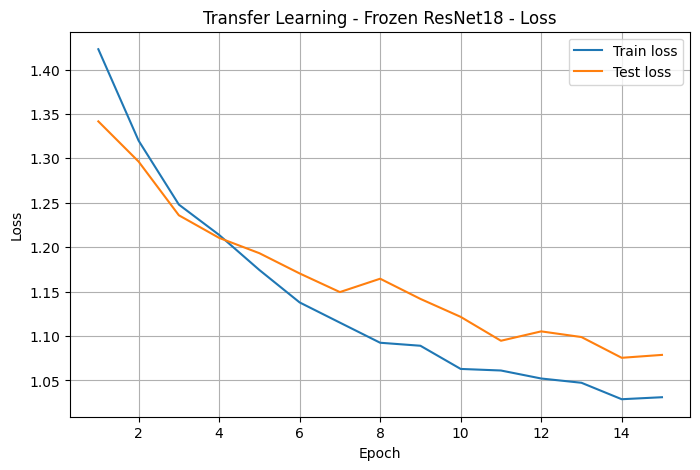

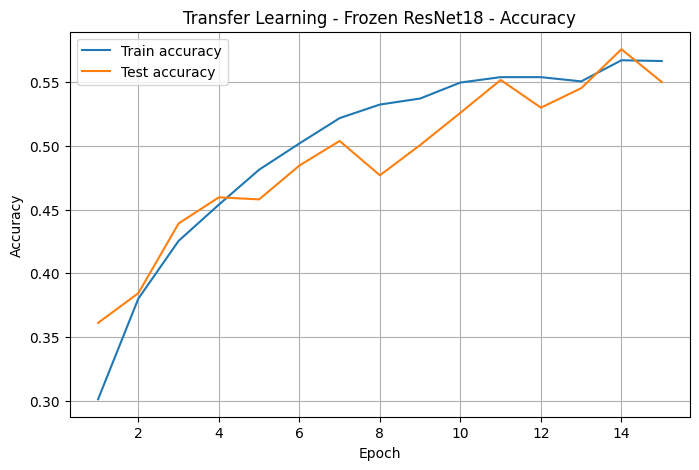

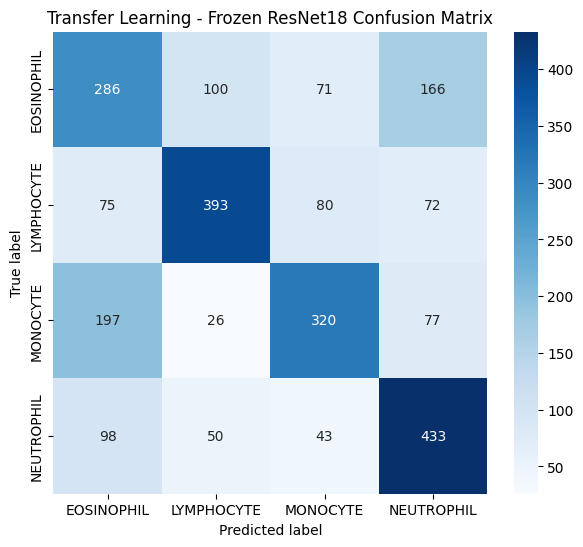

              precision    recall  f1-score   support

  EOSINOPHIL       0.44      0.46      0.45       623
  LYMPHOCYTE       0.69      0.63      0.66       620
    MONOCYTE       0.62      0.52      0.56       620
  NEUTROPHIL       0.58      0.69      0.63       624

    accuracy                           0.58      2487
   macro avg       0.58      0.58      0.58      2487
weighted avg       0.58      0.58      0.58      2487



In [15]:
# ============================================================
# STEP 17 — Transfer Learning with Pretrained ResNet18
# ============================================================
#
# Evaluation of previous step:
# The small residual CNN trained from scratch achieved the best custom-model
# result so far, with around 89% test accuracy. Error analysis showed that
# most remaining mistakes happen between visually similar classes, especially
# EOSINOPHIL and NEUTROPHIL.
#
# Interpretation:
# Our custom CNN models learned useful features from the blood cell dataset,
# but they were trained from scratch using only this dataset. A pretrained CNN
# has already learned general visual features such as edges, shapes, textures,
# and object parts from a much larger image dataset. These features can often
# transfer well to smaller image classification tasks.
#
# Next decision:
# As a final advanced experiment, we use transfer learning with ResNet18.
# We keep the pretrained convolutional backbone and replace the final fully
# connected layer with a new classifier for the 4 blood cell classes.
# This experiment is treated as a bonus comparison, not part of the basic
# baby-step progression.
# ============================================================

from pathlib import Path
import copy
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path("/kaggle/input/blood-cells/dataset2-master/dataset2-master/images")
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 224
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 15
LR = 1e-4
WEIGHT_DECAY = 1e-4
PATIENCE = 5

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(
        brightness=0.10,
        contrast=0.10,
        saturation=0.10
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

train_dataset_tl = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_tl = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_tl = DataLoader(
    train_dataset_tl,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader_tl = DataLoader(
    test_dataset_tl,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


def build_resnet18_transfer_model(num_classes, freeze_backbone=True):
    weights = models.ResNet18_Weights.DEFAULT
    model = models.resnet18(weights=weights)

    if freeze_backbone:
        for param in model.parameters():
            param.requires_grad = False

    in_features = model.fc.in_features

    model.fc = nn.Sequential(
        nn.Dropout(p=0.30),
        nn.Linear(in_features, num_classes)
    )

    return model


def count_parameters(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)

    return total, trainable


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


transfer_model = build_resnet18_transfer_model(
    num_classes=NUM_CLASSES,
    freeze_backbone=True
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, transfer_model.parameters()),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=2
)

total_params, trainable_params = count_parameters(transfer_model)

print("Device:", DEVICE)
print("Classes:", train_dataset_tl.classes)
print(transfer_model)
print("Total parameters:", total_params)
print("Trainable parameters:", trainable_params)

history_transfer = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        transfer_model,
        train_loader_tl,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        transfer_model,
        test_loader_tl,
        criterion,
        DEVICE
    )

    scheduler.step(test_acc)

    history_transfer["train_loss"].append(train_loss)
    history_transfer["train_acc"].append(train_acc)
    history_transfer["test_loss"].append(test_loss)
    history_transfer["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(transfer_model.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "history": history_transfer,
            "class_names": train_dataset_tl.classes
        }, "best_resnet18_transfer_frozen.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    transfer_model.load_state_dict(best_model_state)


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(history_transfer, "Transfer Learning - Frozen ResNet18")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_tl.classes,
    "Transfer Learning - Frozen ResNet18 Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_tl.classes
))

Device: cuda
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.

Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [1/20] Train Loss: 0.7379 | Train Acc: 0.7067 | Test Loss: 0.6928 | Test Acc: 0.7736 | LR: 0.000030


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [2/20] Train Loss: 0.2104 | Train Acc: 0.9328 | Test Loss: 0.6384 | Test Acc: 0.7949 | LR: 0.000030


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [3/20] Train Loss: 0.1065 | Train Acc: 0.9708 | Test Loss: 0.9631 | Test Acc: 0.7250 | LR: 0.000030


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [4/20] Train Loss: 0.0664 | Train Acc: 0.9832 | Test Loss: 0.7775 | Test Acc: 0.7873 | LR: 0.000030


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [5/20] Train Loss: 0.0437 | Train Acc: 0.9888 | Test Loss: 0.8753 | Test Acc: 0.7696 | LR: 0.000015


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [6/20] Train Loss: 0.0323 | Train Acc: 0.9923 | Test Loss: 0.9786 | Test Acc: 0.7559 | LR: 0.000015


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [7/20] Train Loss: 0.0273 | Train Acc: 0.9935 | Test Loss: 0.8803 | Test Acc: 0.7772 | LR: 0.000015


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [8/20] Train Loss: 0.0242 | Train Acc: 0.9944 | Test Loss: 0.9540 | Test Acc: 0.7535 | LR: 0.000008
Early stopping triggered at epoch 8

Best test accuracy: 0.7949
Best epoch: 2


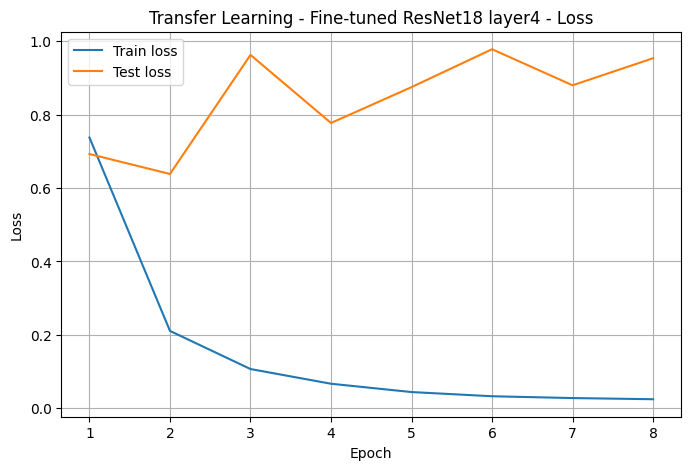

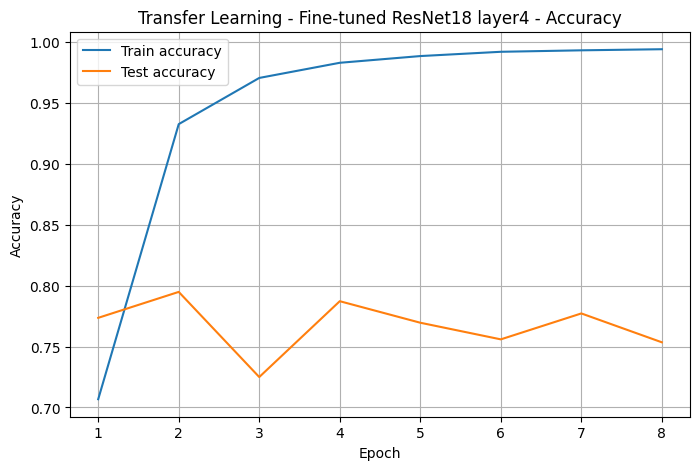

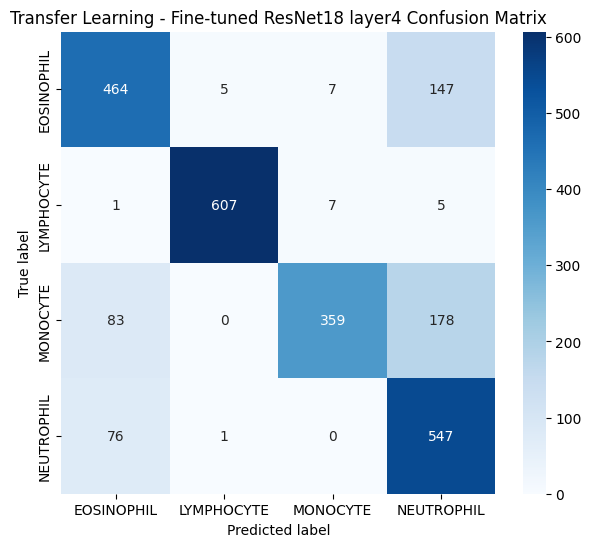

              precision    recall  f1-score   support

  EOSINOPHIL       0.74      0.74      0.74       623
  LYMPHOCYTE       0.99      0.98      0.98       620
    MONOCYTE       0.96      0.58      0.72       620
  NEUTROPHIL       0.62      0.88      0.73       624

    accuracy                           0.79      2487
   macro avg       0.83      0.79      0.80      2487
weighted avg       0.83      0.79      0.80      2487



In [16]:
# ============================================================
# STEP 18 — Transfer Learning with ResNet18 Fine-Tuning
# ============================================================
#
# Evaluation of previous step:
# The frozen ResNet18 transfer learning model performed poorly compared to our
# custom CNN models. It achieved only around 58% test accuracy, while the small
# residual CNN trained from scratch achieved around 89%.
#
# The classification report showed weak performance across all four classes:
# EOSINOPHIL, LYMPHOCYTE, MONOCYTE and NEUTROPHIL. This means that simply using
# a frozen ImageNet feature extractor was not enough for this microscopy image
# classification task.
#
# Interpretation:
# ImageNet images and blood cell microscopy images belong to very different
# visual domains. A frozen pretrained backbone can extract general visual
# features, but it cannot adapt its higher-level representations to cell
# morphology, nucleus appearance, staining patterns and microscopy-specific
# textures.
#
# Next decision:
# Instead of freezing the entire ResNet18 backbone, we fine-tune only the last
# residual block, layer4, and the final classification head. Earlier layers
# remain frozen because they contain general low-level features such as edges,
# colors and simple textures. The last block is allowed to adapt to the blood
# cell domain.
#
# This is treated as a final transfer learning experiment and compared against
# the best custom model trained from scratch.
# ============================================================

from pathlib import Path
import copy
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path("/kaggle/input/blood-cells/dataset2-master/dataset2-master/images")
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 224
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 20
LR = 3e-5
WEIGHT_DECAY = 1e-4
PATIENCE = 6

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(
        brightness=0.10,
        contrast=0.10,
        saturation=0.10
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

train_dataset_tl = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_tl = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_tl = DataLoader(
    train_dataset_tl,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader_tl = DataLoader(
    test_dataset_tl,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


def build_resnet18_finetune_model(num_classes):
    weights = models.ResNet18_Weights.DEFAULT
    model = models.resnet18(weights=weights)

    for param in model.parameters():
        param.requires_grad = False

    for param in model.layer4.parameters():
        param.requires_grad = True

    in_features = model.fc.in_features

    model.fc = nn.Sequential(
        nn.Dropout(p=0.30),
        nn.Linear(in_features, num_classes)
    )

    return model


def count_parameters(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)

    return total, trainable


def print_trainable_layers(model):
    print("\nTrainable layers:")
    for name, param in model.named_parameters():
        if param.requires_grad:
            print(name)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


transfer_model = build_resnet18_finetune_model(
    num_classes=NUM_CLASSES
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, transfer_model.parameters()),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=2
)

total_params, trainable_params = count_parameters(transfer_model)

print("Device:", DEVICE)
print("Classes:", train_dataset_tl.classes)
print(transfer_model)
print("Total parameters:", total_params)
print("Trainable parameters:", trainable_params)
print_trainable_layers(transfer_model)

history_transfer_finetuned = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        transfer_model,
        train_loader_tl,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        transfer_model,
        test_loader_tl,
        criterion,
        DEVICE
    )

    scheduler.step(test_acc)

    history_transfer_finetuned["train_loss"].append(train_loss)
    history_transfer_finetuned["train_acc"].append(train_acc)
    history_transfer_finetuned["test_loss"].append(test_loss)
    history_transfer_finetuned["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(transfer_model.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "history": history_transfer_finetuned,
            "class_names": train_dataset_tl.classes
        }, "best_resnet18_finetuned_layer4.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    transfer_model.load_state_dict(best_model_state)


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(
    history_transfer_finetuned,
    "Transfer Learning - Fine-tuned ResNet18 layer4"
)

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_tl.classes,
    "Transfer Learning - Fine-tuned ResNet18 layer4 Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_tl.classes
))